# Connect to drive


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Imports


In [2]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image

In [3]:
import json

In [4]:
import matplotlib.patches as patches
import numpy as np

In [5]:
import shutil

# Custom data folders: separate images and labels

In [ ]:
# !rm -rf /content/drive/MyDrive/dataset1/labels

In [ ]:
unzip_dataset = '/content/drive/MyDrive/dataset1/dataset1'
dataset_folder = '/content/drive/MyDrive/dataset1'
images_folder = '/content/drive/MyDrive/dataset1/images'
labels_folder = '/content/drive/MyDrive/dataset1/labels'
new_labels_folder = '/content/drive/MyDrive/dataset1/new_labels'


In [ ]:
# # Get a list of subfolders (classes/categories)
# subfolders = [folder for folder in os.listdir(unzip_dataset) if os.path.isdir(os.path.join(unzip_dataset, folder))]

# image_paths = []
# label_paths = []

# for i, class_name in enumerate(subfolders):
#     class_path = os.path.join(unzip_dataset, class_name)

#     # Get all image file names in the class folder
#     images = [img for img in os.listdir(class_path) if img.endswith('.png') and os.path.isfile(os.path.join(class_path, img))]
#     labels = [label for label in os.listdir(class_path) if 'RawMeta' in label and os.path.isfile(os.path.join(class_path, label))]

#     for i in range(0,len(images)):
#       old_image_fn = (os.path.join(class_path, images[i]))
#       new_image_fn = (os.path.join(images_folder, class_name, images[i]))
#       os.replace(old_image_fn, new_image_fn)
#       print(old_image_fn, " moved to: ",  new_image_fn)
#       images[i] = new_image_fn

#       old_label_fn = (os.path.join(class_path, labels[i]))
#       new_label_fn = (os.path.join(labels_folder, class_name, labels[i]))
#       os.replace(old_label_fn, new_label_fn)
#       print(old_label_fn, " moved to: ",  new_label_fn)
#       labels[i] = new_label_fn

#     print("Subfolder ",i,": ", len(images))

#     image_paths.append(images)
#     label_paths.append(labels)

# print("Total: ", len(image_paths[0]) + len(image_paths[1]) + len(image_paths[2]))



In [ ]:
subfolders = [folder for folder in os.listdir(images_folder) if os.path.isdir(os.path.join(images_folder, folder))]

image_paths = []
label_paths = []

for i, class_name in enumerate(subfolders):
    images_class_path = os.path.join(images_folder, class_name)
    labels_class_path = os.path.join(labels_folder, class_name)
    # Get all image file names in the class folder
    images = [img for img in os.listdir(images_class_path) if img.endswith('.png') and os.path.isfile(os.path.join(images_class_path, img))]
    labels = [label for label in os.listdir(labels_class_path) if 'RawMeta' in label and os.path.isfile(os.path.join(labels_class_path, label))]

    image_paths.append(images)
    label_paths.append(labels)

## Open data zip

In [ ]:
!unzip /content/drive/MyDrive/dataset1/dataset1/00/0_depth_grey.zip -d /content/drive/MyDrive/dataset1/dataset1/00

Archive:  /content/drive/MyDrive/dataset1/dataset1/00/0_depth_grey.zip
  inflating: /content/drive/MyDrive/dataset1/dataset1/00/0_depth_0.npy  
  inflating: /content/drive/MyDrive/dataset1/dataset1/00/0_depth_1.npy  
  inflating: /content/drive/MyDrive/dataset1/dataset1/00/0_depth_2.npy  
  inflating: /content/drive/MyDrive/dataset1/dataset1/00/0_depth_3.npy  
  inflating: /content/drive/MyDrive/dataset1/dataset1/00/0_depth_4.npy  
  inflating: /content/drive/MyDrive/dataset1/dataset1/00/0_depth_5.npy  
  inflating: /content/drive/MyDrive/dataset1/dataset1/00/0_depth_6.npy  
  inflating: /content/drive/MyDrive/dataset1/dataset1/00/0_depth_7.npy  
  inflating: /content/drive/MyDrive/dataset1/dataset1/00/0_depth_8.npy  
  inflating: /content/drive/MyDrive/dataset1/dataset1/00/0_depth_9.npy  
  inflating: /content/drive/MyDrive/dataset1/dataset1/00/0_depth_10.npy  
  inflating: /content/drive/MyDrive/dataset1/dataset1/00/0_depth_11.npy  
  inflating: /content/drive/MyDrive/dataset1/datase

# Data preprocessing


In [ ]:
for i, subfolder in enumerate(image_paths):
  print("Subfolder ", i,": ", len(subfolder))

print("Total: ", len(image_paths[0]) + len(image_paths[1]) + len(image_paths[2]))

Subfolder  0 :  1129
Subfolder  1 :  1074
Subfolder  2 :  1039
Total:  3242


In [ ]:
def getBboxes(bbox_fn):
    with open(bbox_fn, 'r') as f:
        bbox_data = json.load(f)
    return eval(str(bbox_data))['TrackedObj']

In [ ]:
def visuallise_image_with_bbox(image_fn, label_fn):
      img = Image.open(img_fn)
      bbox_data = getBboxes(label_fn)
      fig, ax = plt.subplots(1)
      ax.imshow(img)

      for bbox in bbox_data:
        bb2d = bbox['BB2D']
        x = np.clip(bb2d[0]['X'], 0, img.size[0]) # Clip bbox to image width
        y = np.clip(bb2d[0]['Y'], 0, img.size[1]) # Clip bbox to image height
        x1 = np.clip(bb2d[1]['X'], 0, img.size[0]) # Clip bbox to image width
        y1 = np.clip(bb2d[1]['Y'], 0, img.size[1]) # Clip bbox to image height
        rect = patches.Rectangle(
          (x, y), x1-x, y1-y,
          linewidth=2, edgecolor='r', facecolor='none'
        )
        ax.add_patch(rect)
        ax.text(
            x, y, bbox['Alias'], color='black',
            fontsize=5
        )

## Visallise dataset


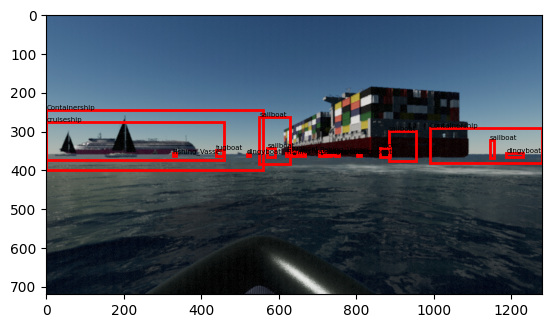

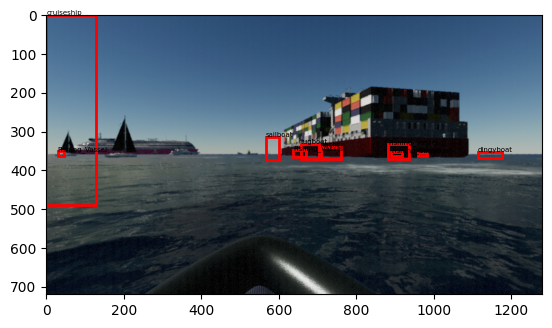

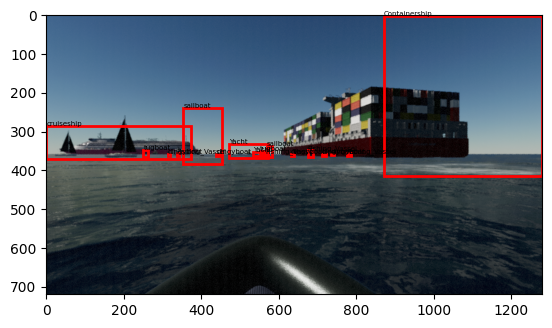

In [ ]:
# Function to visualize random samples
def visualize_random_samples(n_samples=5):
  for subfolder in image_paths:
    for n in range(0,n_samples):
      # Randomly select an image
      img_fn = random.choice(subfolder)
      bbox_fn = img_fn.replace('CamFeed', 'RawMeta').replace('.png','.txt').replace('images','labels')

      visuallise_image_with_bbox(img_fn, bbox_fn)

# Call the function to visualize random samples
visualize_random_samples(n_samples=1)


In [ ]:
def make_white_pixels_transparent(rgba_image):
    image = (np.array(rgba_image)[:, :, :3]).astype(np.uint8)
    alpha_channel = (np.array(rgba_image)[:, :, 3]).astype(np.uint8)
    # Set white or near-white pixels to be transparent
    white_threshold = 90  # Threshold for near-white pixels
    mask = np.all(image >= white_threshold, axis=-1)
    alpha_channel[mask] = 0
    rgba_image = np.dstack([image, alpha_channel])
    return rgba_image

In [ ]:
def shift_image_left(rgb_image, shift_amount):
    # Create a new array with the same shape as the input image
    shifted_image = np.zeros_like(rgb_image)

    # Shift the pixels to the left by slicing
    shifted_image[:, :-shift_amount, :] = rgb_image[:, shift_amount:, :]

    # The right side (last 'shift_amount' columns) will be black (filled with 0s)

    return shifted_image


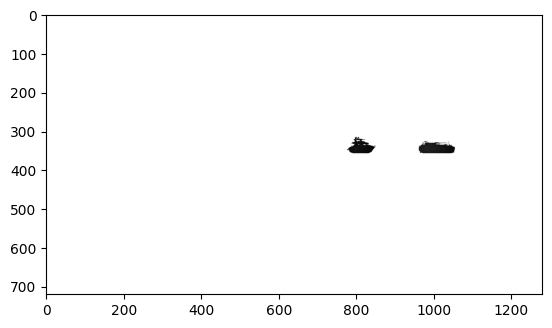

In [ ]:
def show_only_range(arr, lower_bound, upper_bound):
  # Set values outside the range to 0
  arr = np.where((arr >= lower_bound) & (arr <= upper_bound), arr, 0)
  return arr
data = np.load('/content/drive/MyDrive/dataset1/dataset1/00/0_depth_200.npy')
plt.imshow(show_only_range(data,10,20),cmap='gist_gray_r')





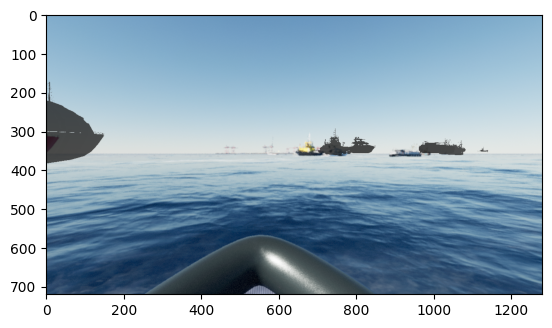

In [ ]:
data = np.load('/content/drive/MyDrive/dataset1/dataset1/00/0_depth_200.npy')
rgb_mask = Image.fromarray(data).convert('RGBA')
rgb_mask = make_white_pixels_transparent(rgb_mask)
# rgb_mask = shift_image_left(rgb_mask, 100)
image = (Image.open('/content/drive/MyDrive/dataset1/images/00/0_CamFeed_200.png'))
plt.imshow(image)
plt.imshow(rgb_mask, cmap='gist_gray', alpha=0.75)

## Small Bbox cleanup


### Visuallise difference before and after small box cleanup

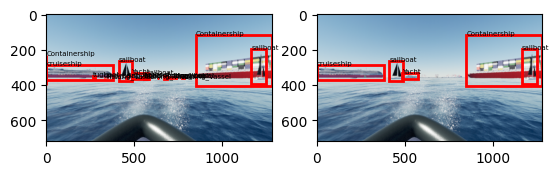

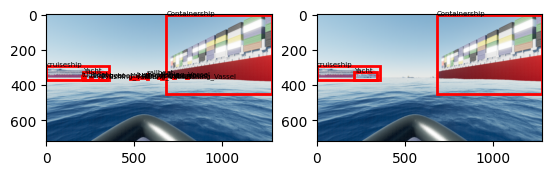

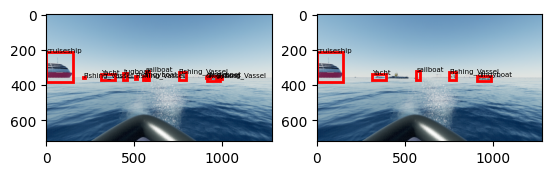

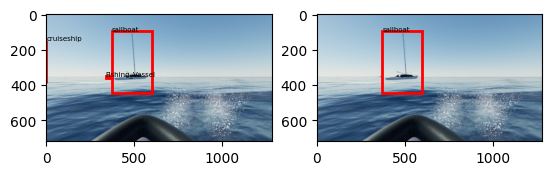

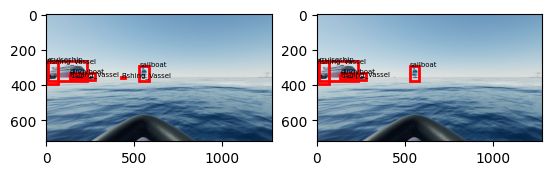

...

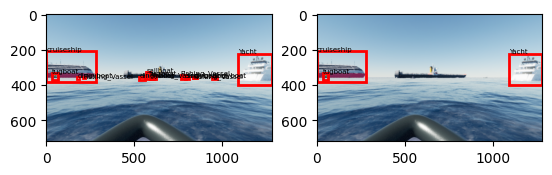

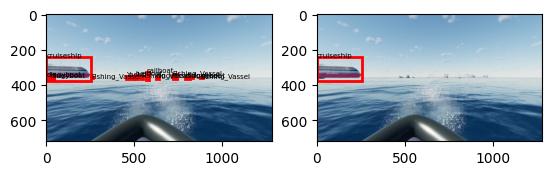

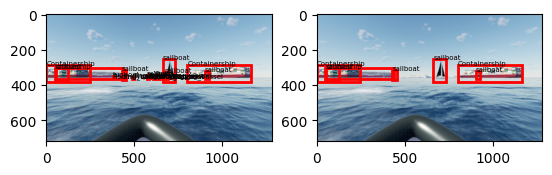

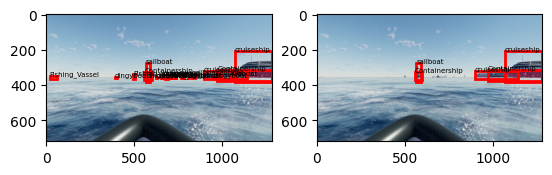

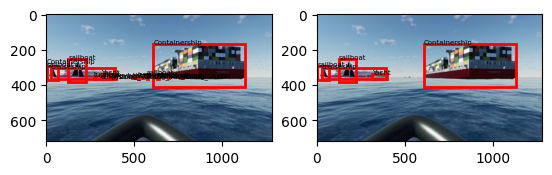

In [ ]:
# Function to visualize random samples
def visualize_random_samples_small_box(dataset_folder, n_samples=5):
  for subfolder in image_paths:
    for n in range(0,n_samples):
      # Randomly select an image
      img_fn = random.choice(subfolder)
      bbox_fn = img_fn.replace('CamFeed', 'RawMeta').replace('.png','.txt').replace('images','labels')
      img = Image.open(img_fn)
      bbox_data = getBboxes(bbox_fn)

      fig, ax = plt.subplots(1, 2)
      ax[0].imshow(img)
      ax[1].imshow(img)

      for bbox in bbox_data:
        bb2d = bbox['BB2D']
        x = np.clip(bb2d[0]['X'], 0, img.size[0]) # Clip bbox to image width
        y = np.clip(bb2d[0]['Y'], 0, img.size[1]) # Clip bbox to image height
        x1 = np.clip(bb2d[1]['X'], 0, img.size[0]) # Clip bbox to image width
        y1 = np.clip(bb2d[1]['Y'], 0, img.size[1]) # Clip bbox to image height

        if ( x1 - x) * (y1 - y) <= 1000:
          rect = patches.Rectangle(
            (x, y), x1-x, y1-y,
            linewidth=2, edgecolor='r', facecolor='none'
          )
          ax[0].add_patch(rect)
          ax[0].text(
              x, y, bbox['Alias'], color='black',
              fontsize=5
          )
        else:
          rect = patches.Rectangle(
            (x, y), x1-x, y1-y,
            linewidth=2, edgecolor='r', facecolor='none'
          )
          ax[0].add_patch(rect)
          ax[0].text(
              x, y, bbox['Alias'], color='black',
              fontsize=5
          )

          rect = patches.Rectangle(
            (x, y), x1-x, y1-y,
            linewidth=2, edgecolor='r', facecolor='none'
          )
          ax[1].add_patch(rect)
          ax[1].text(
              x, y, bbox['Alias'], color='black',
              fontsize=5
          )


# Call the function to visualize random samples
visualize_random_samples_small_box(dataset_folder, n_samples=4)


### Create new labels

In [ ]:
new_labels = []
new_label_folder = '/content/drive/MyDrive/dataset1/new_labels'

for j, subfolder in enumerate(label_paths):
  subfolderList = []
  for label_fn in subfolder:
    with open(label_fn, 'r') as f:
        file_data = eval(json.load(f))

    bbox_data = file_data['TrackedObj']

    img_fn = label_fn.replace('RawMeta', 'CamFeed').replace('.txt','.png').replace('labels','images')
    img = Image.open(img_fn)

    indexes_to_del = []
    for i, bbox in enumerate(bbox_data):
      bb2d = bbox['BB2D']
      x = np.clip(bb2d[0]['X'], 0, img.size[0]) # Clip bbox to image width
      y = np.clip(bb2d[0]['Y'], 0, img.size[1]) # Clip bbox to image height
      x1 = np.clip(bb2d[1]['X'], 0, img.size[0]) # Clip bbox to image width
      y1 = np.clip(bb2d[1]['Y'], 0, img.size[1]) # Clip bbox to image height

      if ( x1 - x) * (y1 - y) <= 1000:
        indexes_to_del.append(i)

    for i,index in enumerate(indexes_to_del):
      del (file_data['TrackedObj'])[index - i]

    new_label_fn = os.path.join(new_label_folder, os.path.basename(os.path.dirname(label_fn)), os.path.basename(label_fn))
    print(new_label_fn)
    # with open(new_label_fn, 'w') as f:
    #   f.write(json.dumps(file_data))

    subfolderList.append(new_label_fn)
  new_labels.append(subfolderList)

/content/drive/MyDrive/dataset1/new_labels/00/0_RawMeta_0.txt
/content/drive/MyDrive/dataset1/new_labels/00/0_RawMeta_1.txt
/content/drive/MyDrive/dataset1/new_labels/00/0_RawMeta_10.txt
/content/drive/MyDrive/dataset1/new_labels/00/0_RawMeta_100.txt
/content/drive/MyDrive/dataset1/new_labels/00/0_RawMeta_1000.txt
/content/drive/MyDrive/dataset1/new_labels/00/0_RawMeta_1001.txt
/content/drive/MyDrive/dataset1/new_labels/00/0_RawMeta_1002.txt
/content/drive/MyDrive/dataset1/new_labels/00/0_RawMeta_1003.txt
/content/drive/MyDrive/dataset1/new_labels/00/0_RawMeta_1004.txt
/content/drive/MyDrive/dataset1/new_labels/00/0_RawMeta_1005.txt
/content/drive/MyDrive/dataset1/new_labels/00/0_RawMeta_1006.txt
/content/drive/MyDrive/dataset1/new_labels/00/0_RawMeta_1007.txt
/content/drive/MyDrive/dataset1/new_labels/00/0_RawMeta_1008.txt
/content/drive/MyDrive/dataset1/new_labels/00/0_RawMeta_1009.txt
/content/drive/MyDrive/dataset1/new_labels/00/0_RawMeta_101.txt
/content/drive/MyDrive/dataset1/new

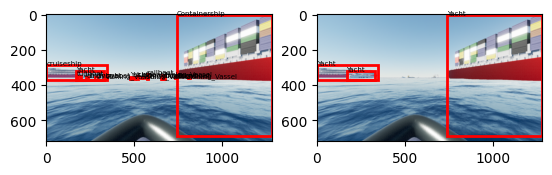

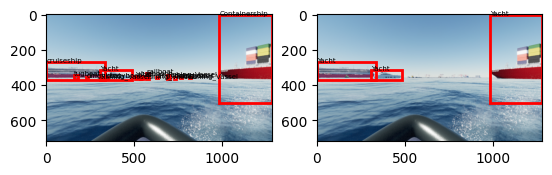

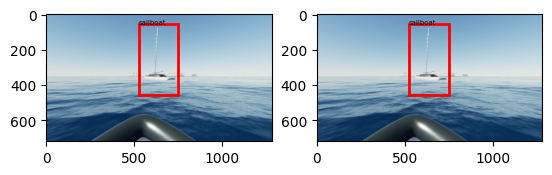

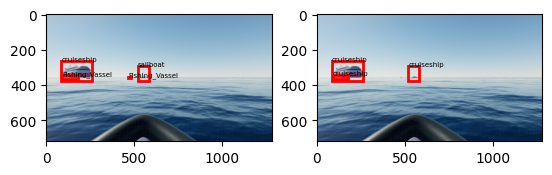

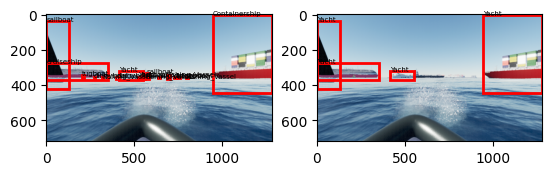

...

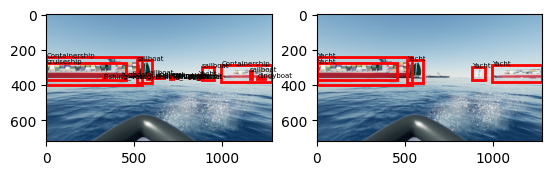

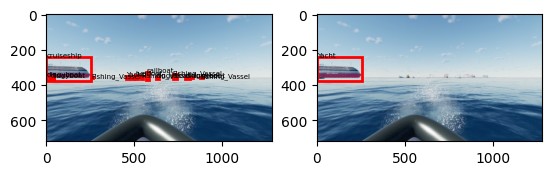

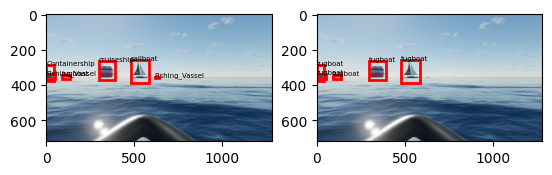

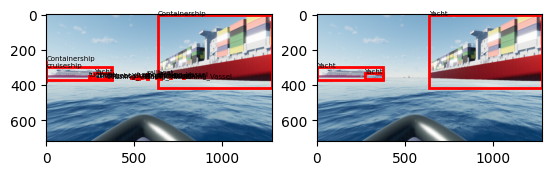

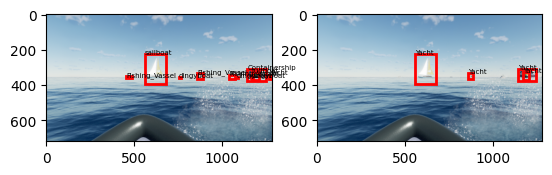

In [ ]:
n_samples = 4
for subfolder in image_paths:
  for n in range(0,n_samples):
    # Randomly select an image
    img_fn = random.choice(subfolder)
    bbox_fn = img_fn.replace('CamFeed', 'RawMeta').replace('.png','.txt').replace('images','labels')
    new_bbox_fn = bbox_fn.replace(labels_folder, new_label_folder)

    img = Image.open(img_fn)
    bbox_data = getBboxes(bbox_fn)
    new_bbox_data = getBboxes(new_bbox_fn)

    fig, ax = plt.subplots(1, 2)
    ax[0].imshow(img)
    ax[1].imshow(img)

    for bbox in bbox_data:
      bb2d = bbox['BB2D']
      x = np.clip(bb2d[0]['X'], 0, img.size[0]) # Clip bbox to image width
      y = np.clip(bb2d[0]['Y'], 0, img.size[1]) # Clip bbox to image height
      x1 = np.clip(bb2d[1]['X'], 0, img.size[0]) # Clip bbox to image width
      y1 = np.clip(bb2d[1]['Y'], 0, img.size[1]) # Clip bbox to image height

      rect = patches.Rectangle(
        (x, y), x1-x, y1-y,
        linewidth=2, edgecolor='r', facecolor='none'
      )
      ax[0].add_patch(rect)
      ax[0].text(
          x, y, bbox['Alias'], color='black',
          fontsize=5
      )

    for new_bbox in new_bbox_data:
      bb2d = new_bbox['BB2D']
      x = np.clip(bb2d[0]['X'], 0, img.size[0]) # Clip bbox to image width
      y = np.clip(bb2d[0]['Y'], 0, img.size[1]) # Clip bbox to image height
      x1 = np.clip(bb2d[1]['X'], 0, img.size[0]) # Clip bbox to image width
      y1 = np.clip(bb2d[1]['Y'], 0, img.size[1]) # Clip bbox to image height

      rect = patches.Rectangle(
        (x, y), x1-x, y1-y,
        linewidth=2, edgecolor='r', facecolor='none'
      )
      ax[1].add_patch(rect)
      ax[1].text(
          x, y, bbox['Alias'], color='black',
          fontsize=5
      )

# Dataset stats


In [ ]:
subfolders = [folder for folder in os.listdir(images_folder) if os.path.isdir(os.path.join(images_folder, folder))]

image_paths = []
label_paths = []
new_label_paths = []

for i, class_name in enumerate(subfolders):
    images_class_path = os.path.join(images_folder, class_name)
    labels_class_path = os.path.join(labels_folder, class_name)
    new_labels_class_path = os.path.join(new_labels_folder, class_name)

    # Get all image file names in the class folder
    images = [img for img in os.listdir(images_class_path) if img.endswith('.png') and os.path.isfile(os.path.join(images_class_path, img))]
    labels = [label for label in os.listdir(labels_class_path) if 'RawMeta' in label and os.path.isfile(os.path.join(labels_class_path, label))]
    new_labels = [label for label in os.listdir(new_labels_class_path) if 'RawMeta' in label and os.path.isfile(os.path.join(new_labels_class_path, label))]

    for i in range(0,len(images)):
      images[i] = os.path.join(images_class_path, images[i])
      labels[i] = os.path.join(labels_class_path, labels[i])
      new_labels[i] = os.path.join(new_labels_class_path, new_labels[i])

    image_paths.append(images)
    label_paths.append(labels)
    new_label_paths.append(new_labels)

### Dataset distribution

In [ ]:
# Number of classes
classes = {}
count = 0
for i, subfolder in enumerate(label_paths):
  for bbox_fn in subfolder:
    bbox_data = getBboxes(bbox_fn)
    for bbox in bbox_data:
      count += 1
      label = bbox['Alias']
      if label in classes:
        classes[label] += 1
      else:
        classes[label] = 1


print(classes)
print(count)


KeyboardInterrupt: 

In [ ]:
# Number of classes
new_classes = {}
count = 0
for i, subfolder in enumerate(new_label_paths):
  for bbox_fn in subfolder:
    bbox_data = getBboxes(bbox_fn)
    for bbox in bbox_data:
      count += 1
      label = bbox['Alias']
      if label in new_classes:
        new_classes[label] += 1
      else:
        new_classes[label] = 1


print(new_classes)
print(count)


{'Containership': 2476, 'sailboat': 4095, 'cruiseship': 2907, 'Yacht': 1709, 'dingyboat': 586, 'tugboat': 784, 'Fishing_Vassel': 1379}
13936


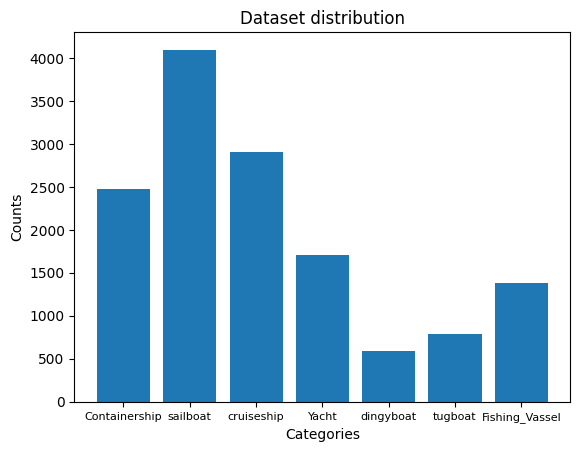

In [ ]:
# Extract keys and values from the dictionary
categories = list(new_classes.keys())
counts = list(new_classes.values())

# Create the bar chart
plt.bar(categories, counts)

plt.xticks(fontsize=8)

# Add labels and title
plt.xlabel('Categories')
plt.ylabel('Counts')
plt.title('Dataset distribution')

# Display the chart
plt.show()

### Attribute correlations


In [ ]:
import pandas as pd

In [ ]:
all_label_data = []
for subfolder in new_label_paths:
  for label_fn in subfolder:
    bbox_data = getBboxes(label_fn)
    for bbox in bbox_data:
      bb2d = bbox['BB2D']
      x = bb2d[0]['X']
      y = bb2d[0]['Y']
      x1 = bb2d[1]['X']
      y1 = bb2d[1]['Y']
      data = [bbox['Alias'], (x1-x) * (y1-y), x1-x , y1-y]
      all_label_data.append(data)

alias_area_df = pd.DataFrame(all_label_data, columns=["Alias","Area", "Width", "Height"])
print(alias_area_df)

In [ ]:
df_encoded = pd.get_dummies(alias_area_df, columns=['Alias'])


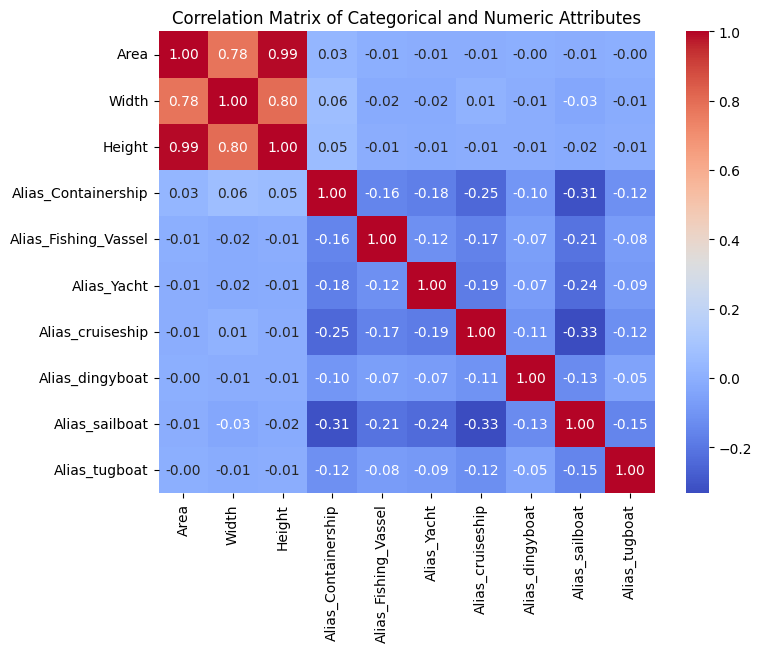

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate correlation matrix
correlation_matrix = df_encoded.corr()

# Plot the correlation matrix
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Matrix of Categorical and Numeric Attributes')
plt.show()


## Image Quality Analysis

### Color distributions


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def analyze_color_distribution(folder):
    color_data = []
    for filename in folder:
        if filename.endswith('.png') or filename.endswith('.jpg'):
            img = Image.open(filename)
            img_data = np.array(img)
            color_data.append(img_data.mean(axis=(0, 1)))  # mean across width, height
    return np.array(color_data)


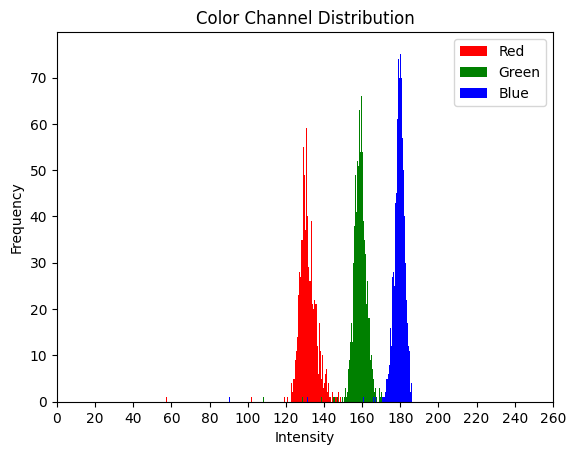

In [ ]:
color_distribution_1 = analyze_color_distribution(image_paths[0])

# Plot average color channels
plt.hist(color_distribution_1[:, 0], bins=255, label='Red', color = 'Red')
plt.hist(color_distribution_1[:, 1], bins=255, label='Green', color = 'Green')
plt.hist(color_distribution_1[:, 2], bins=255, label='Blue', color = 'Blue')
plt.xticks(np.arange(0, 265, step=20), fontsize= 10)
# plt.yticks(np.arange(0, 110, step=20), fontsize= 10)
plt.xlabel('Intensity', fontsize=10)
plt.ylabel('Frequency', fontsize=10)
plt.legend()
plt.title('Color Channel Distribution')
plt.show()



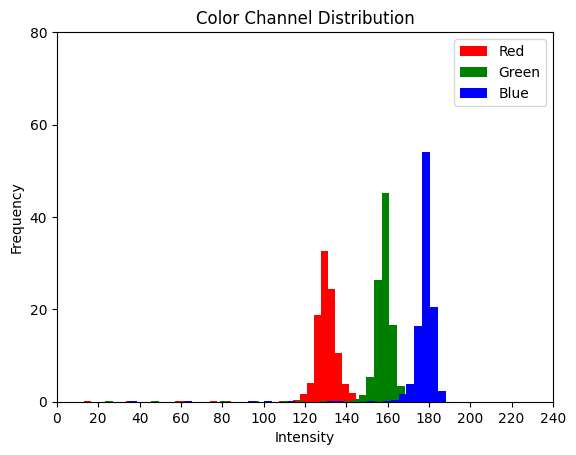

In [ ]:
color_distribution = analyze_color_distribution(image_paths[2])

# Plot average color channels
plt.hist(color_distribution[:, 0], bins=40, label='Red', color = 'Red',weights=np.ones(len(color_distribution)) * 100 / len(color_distribution))
plt.hist(color_distribution[:, 1], bins=40, label='Green', color = 'Green',weights=np.ones(len(color_distribution)) * 100 / len(color_distribution))
plt.hist(color_distribution[:, 2], bins=40, label='Blue', color = 'Blue',weights=np.ones(len(color_distribution)) * 100 / len(color_distribution))
plt.xticks(np.arange(0, 255, step=20), fontsize= 10)
plt.yticks(np.arange(0, 100, step=20), fontsize= 10)
plt.xlabel('Intensity', fontsize=10)
plt.ylabel('Frequency', fontsize=10)
plt.legend()
plt.title('Color Channel Distribution')
plt.show()


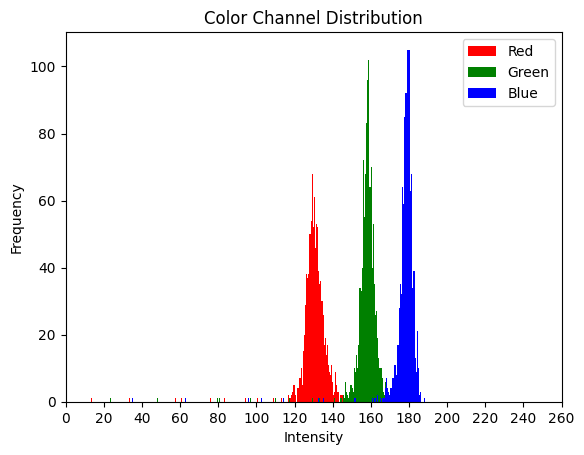

In [ ]:
plt.hist(color_distribution[:, 0], bins=255, label='Red', color = 'Red')
plt.hist(color_distribution[:, 1], bins=255, label='Green', color = 'Green')
plt.hist(color_distribution[:, 2], bins=255, label='Blue', color = 'Blue')
plt.xticks(np.arange(0, 265, step=20), fontsize= 10)
# plt.yticks(np.arange(0, 110, step=20), fontsize= 10)
plt.xlabel('Intensity', fontsize=10)
plt.ylabel('Frequency', fontsize=10)
plt.legend()
plt.title('Color Channel Distribution')
plt.show()

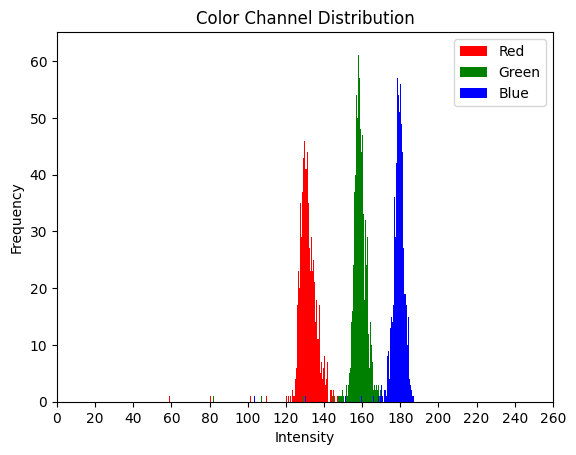

In [ ]:
# color_distribution_3 = analyze_color_distribution(image_paths[3])

# Plot average color channels
plt.hist(color_distribution_3[:, 0], bins=255, label='Red', color = 'Red')
plt.hist(color_distribution_3[:, 1], bins=255, label='Green', color = 'Green')
plt.hist(color_distribution_3[:, 2], bins=255, label='Blue', color = 'Blue')
plt.xticks(np.arange(0, 265, step=20), fontsize= 10)
# plt.yticks(np.arange(0, 110, step=20), fontsize= 10)
plt.xlabel('Intensity', fontsize=10)
plt.ylabel('Frequency', fontsize=10)
plt.legend()
plt.title('Color Channel Distribution')
plt.show()


### Sharpness and focus

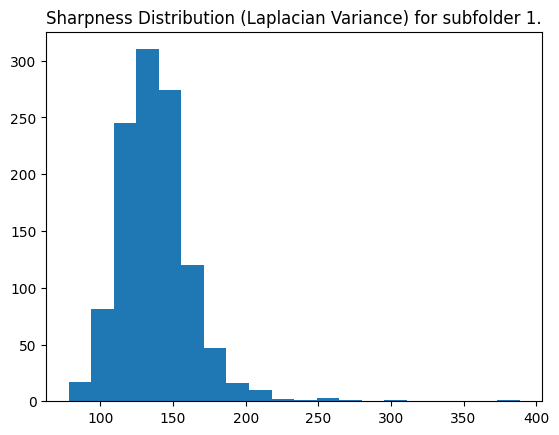

137.72656113780673
0
0


In [ ]:
import cv2
import numpy as np

low_res = 0
high_res = 0

def analyze_sharpness(img_path, low_res, high_res):
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    laplacian_var = cv2.Laplacian(img, cv2.CV_64F).var()
    return laplacian_var

sharpness_values = [analyze_sharpness(f, low_res, high_res) for f in (image_paths[0]) if f.endswith(('.png', '.jpg'))]
plt.hist(sharpness_values, bins=30)
plt.xticks(np.arange(0, 260, step=20))
plt.title('Sharpness Distribution (Laplacian Variance) for subfolder 1.')
plt.show()

print(np.mean(sharpness_values))


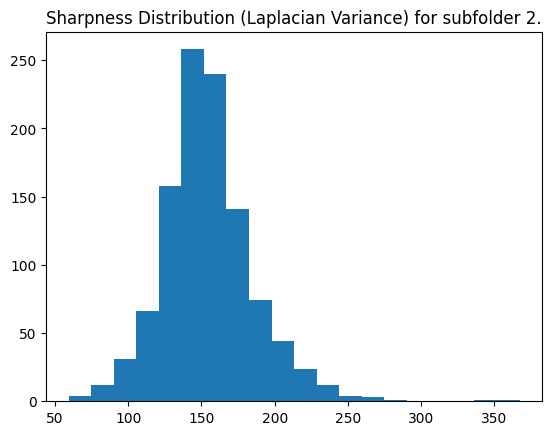

154.74136079241393


In [ ]:
sharpness_values = [analyze_sharpness(f, low_res, high_res) for f in (image_paths[2]) if f.endswith(('.png', '.jpg'))]
plt.hist(sharpness_values, bins=30)
plt.xticks(np.arange(0, 260, step=20))
plt.title('Sharpness Distribution (Laplacian Variance) for subfolder 2.')
plt.show()

print(np.mean(sharpness_values))

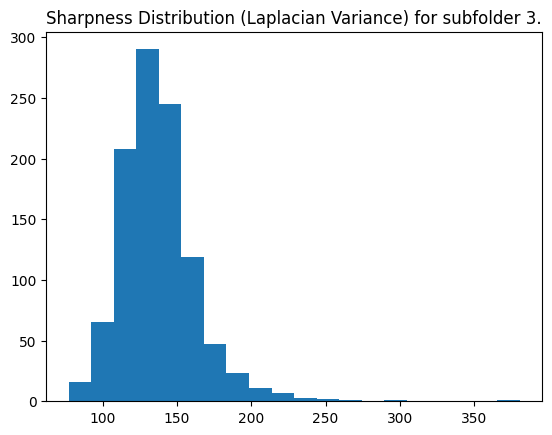

137.36317897312944


In [ ]:
sharpness_values = [analyze_sharpness(f, low_res, high_res) for f in (image_paths[3]) if f.endswith(('.png', '.jpg'))]
plt.hist(sharpness_values, bins=30)
plt.xticks(np.arange(0, 260, step=20))
plt.title('Sharpness Distribution (Laplacian Variance) for subfolder 3.')
plt.show()

print(np.mean(sharpness_values))

### Noise Levels

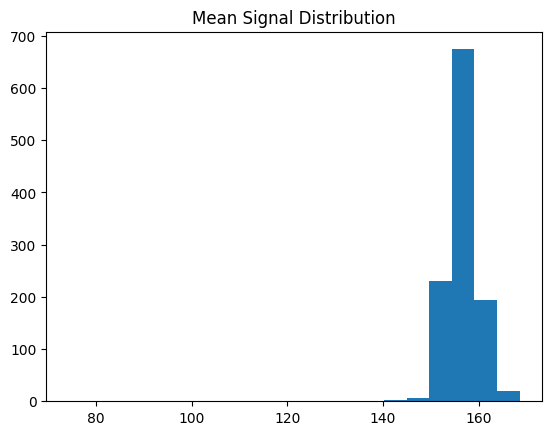

In [ ]:
def calculate_snr(image):
    mean_signal = np.mean(image)
    noise = image - mean_signal
    noise_std = np.std(noise)
    snr = mean_signal / noise_std if noise_std != 0 else np.inf
    return snr, mean_signal

def analyze_snr(folder):
    snr_values = []
    mean_signals = []
    for filename in folder:
        if filename.endswith('.png') or filename.endswith('.jpg'):
            img = np.array(Image.open(filename))
            snr, mean = calculate_snr(img)
            snr_values.append(snr)
            mean_signals.append(mean)
    return snr_values, mean_signals

snr_values, mean_signals = analyze_snr(image_paths[0])
plt.hist(snr_values, bins=10)
plt.xticks(np.arange(0, 5, step=1))
plt.title('SNR Distribution')
plt.show()

plt.hist(mean_signals, bins=10)
plt.xticks(np.arange(0, 180, step=10))
plt.title('Mean Signal Distribution')
plt.show()


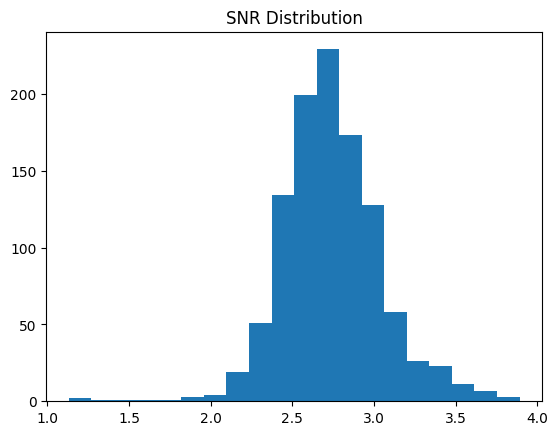

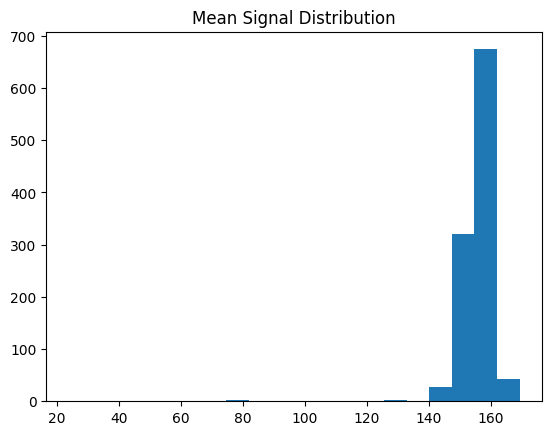

In [ ]:
snr_values, mean_signals = analyze_snr(image_paths[2])
plt.hist(snr_values, bins=10)
plt.xticks(np.arange(0, 5, step=1))
plt.title('SNR Distribution')
plt.show()

plt.hist(mean_signals, bins=10)
plt.xticks(np.arange(0, 180, step=10))
plt.title('Mean Signal Distribution')
plt.show()

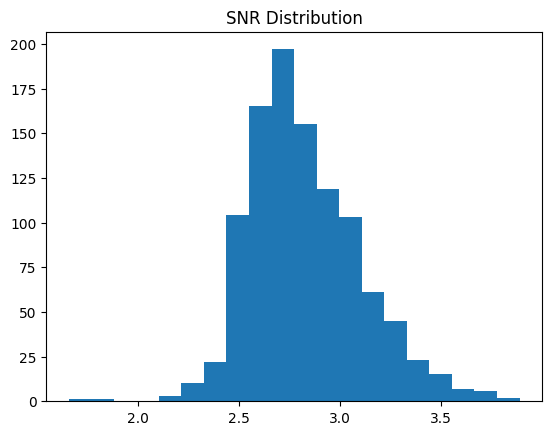

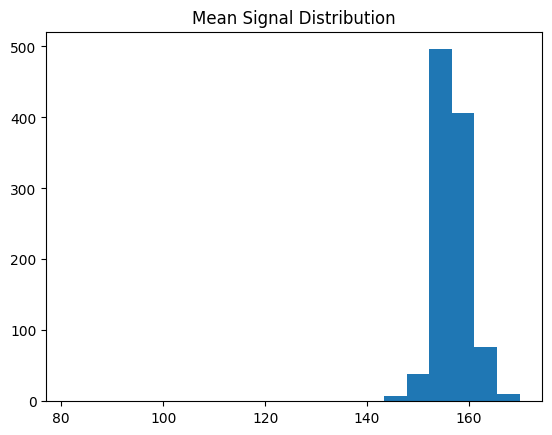

In [ ]:
snr_values, mean_signals = analyze_snr(image_paths[3])
plt.hist(snr_values, bins=10)
plt.xticks(np.arange(0, 5, step=1))
plt.title('SNR Distribution')
plt.show()

plt.hist(mean_signals, bins=10)
plt.xticks(np.arange(0, 180, step=10))
plt.title('Mean Signal Distribution')
plt.show()

### Brightness and Contrast Analysis

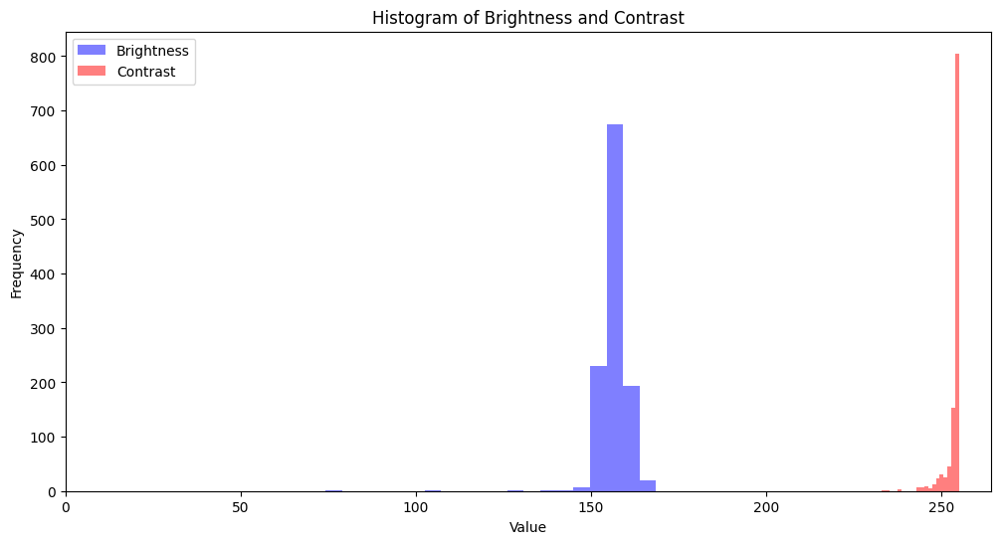

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Function to calculate brightness and contrast
def calculate_brightness_contrast(img):
    brightness = np.mean(img)
    contrast = img.max() - img.min()
    return brightness, contrast

def plotGraph(image_paths):
  # Calculate brightness and contrast for each image
  brightness_values = []
  contrast_values = []
  for f in image_paths:
      if f.endswith(('.png', '.jpg')):
          img = np.array(Image.open(f))
          brightness, contrast = calculate_brightness_contrast(img)
          brightness_values.append(brightness)
          contrast_values.append(contrast)

  # Plot brightness and contrast histograms on the same graph
  plt.figure(figsize=(12, 6))

  # Plot histogram for brightness
  plt.hist(brightness_values, bins=20, alpha=0.5, label='Brightness', color='blue')

  # Plot histogram for contrast
  plt.hist(contrast_values, bins=20, alpha=0.5, label='Contrast', color='red')

  # Add labels and title
  plt.xlabel('Value')
  plt.xticks(np.arange(0, 255, step=50))
  plt.ylabel('Frequency')
  plt.title('Histogram of Brightness and Contrast')

  # Show legend
  plt.legend()

  # Show plot
  plt.show()

plotGraph(image_paths[0])


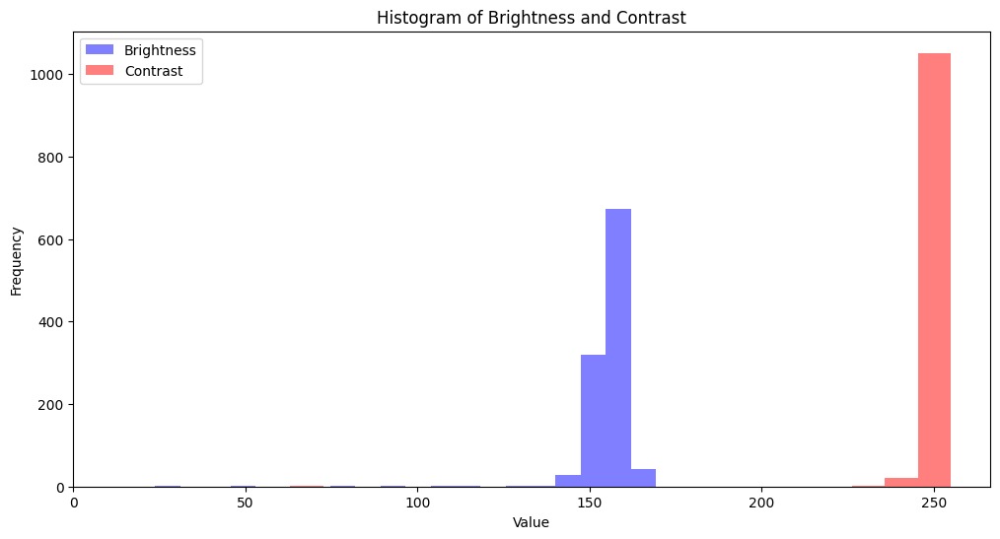

In [ ]:
plotGraph(image_paths[2])

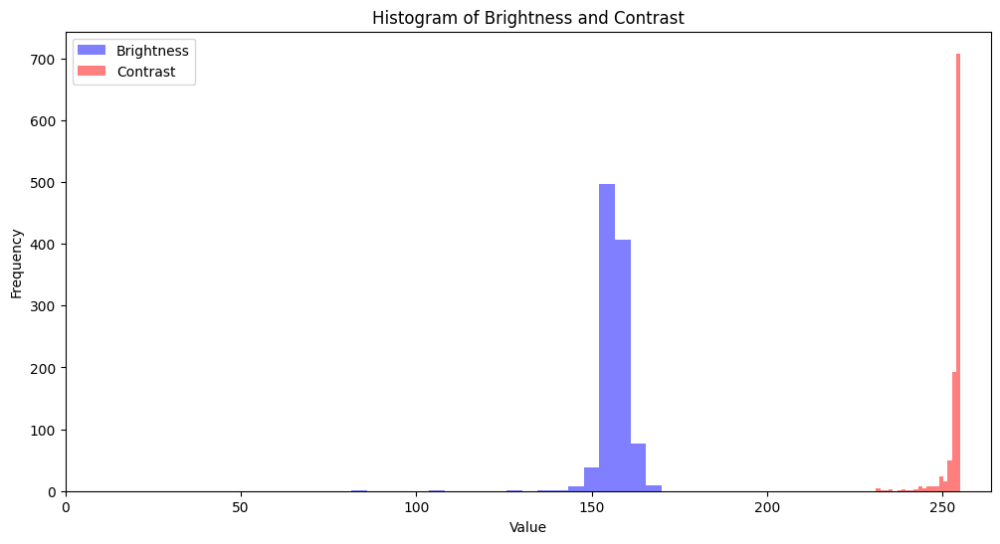

In [ ]:
plotGraph(image_paths[3])

# Video analysis

## Video with bboxes


In [ ]:
import re

In [ ]:
def natural_sort_key(s):
    """Sort filenames in natural order."""
    return [int(text) if text.isdigit() else text.lower() for text in re.split('([0-9]+)', s)]


In [ ]:
import cv2
import os
import json
import re

def natural_sort_key(s):
    """Sort filenames in natural order."""
    return [int(text) if text.isdigit() else text.lower() for text in re.split('([0-9]+)', s)]

def load_bounding_boxes(bbox_file):
    """Load bounding boxes from a JSON file."""
    with open(bbox_file, 'r') as f:
        bbox_data = json.load(f)
    return eval(str(bbox_data))['TrackedObj']

def get_color_for_label(label):
    labels = {'Containership': (255,0,0),
      'sailboat': (176,224,230),
      'cruiseship': (0,128,0) ,
      'Yacht': (255,255,0),
      'dingyboat': (128,0,128),
      'tugboat': (255,192,203),
      'Fishing_Vassel': (0,0,0)
    }

    return labels[label]

def draw_bounding_boxes(image, boxes):
    """Draw bounding boxes with labels on an image."""
    for new_bbox in boxes:
        label = new_bbox['Alias']
        color = get_color_for_label(label)
        bb2d = new_bbox['BB2D']
        x = np.clip(bb2d[0]['X'], 0, image.shape[1]) # Clip bbox to image width
        y = np.clip(bb2d[0]['Y'], 0, image.shape[0]) # Clip bbox to image height
        x1 = np.clip(bb2d[1]['X'], 0, image.shape[1]) # Clip bbox to image width
        y1 = np.clip(bb2d[1]['Y'], 0, image.shape[0]) # Clip bbox to image height
        cv2.rectangle(image, (int(x), int(y)), (int(x1), int(y1)), color, 2)  # Draw green rectangle
        cv2.putText(image, f'{label}', (int(x), int(y - 10)), cv2.FONT_HERSHEY_COMPLEX_SMALL, 0.25, color, 1)  # Add label
    return image

def create_video_from_images(image_folder, bbox_folder, output_video_path, frame_rate=30):
    # Get list of image files
    images = [img for img in os.listdir(image_folder) if img.endswith(('.png', '.jpg', '.jpeg'))]
    images.sort(key=natural_sort_key)  # Sort using natural sorting

    # Read the first image to get the size (width, height)
    first_image = cv2.imread(os.path.join(image_folder, images[0]))
    height, width, layers = first_image.shape

    # Define the codec and create VideoWriter object
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # You can also use 'XVID' or 'MJPG'
    video = cv2.VideoWriter(output_video_path, fourcc, frame_rate, (width, height))

    # Write each image to the video with bounding boxes
    for image_name in images:
        img_path = os.path.join(image_folder, image_name)
        bbox_file =  img_path.replace('CamFeed', 'RawMeta').replace('.png','.txt').replace('images','feature_labels')

        # Load the image and bounding boxes
        image = cv2.imread(img_path)
        if os.path.exists(bbox_file):
            boxes = load_bounding_boxes(bbox_file)
            image = draw_bounding_boxes(image, boxes)

        # Write the image to the video
        video.write(image)

    # Release the VideoWriter object
    video.release()
    print(f'Video saved as {output_video_path}')

# Example usage
image_folder = '/content/drive/MyDrive/dataset1/images/01'
bbox_folder = '/content/drive/MyDrive/dataset1/feature_labels/00'
output_video_path = 'output_video_with_boxes.mp4'
create_video_from_images(image_folder, bbox_folder, output_video_path)


Video saved as output_video_with_boxes.mp4


In [ ]:
image_folder = '/content/drive/MyDrive/dataset1/images/02'
bbox_folder = '/content/drive/MyDrive/dataset1/new_labels/02'
output_video_path = 'output_video_with_boxes.mp4'
create_video_from_images(image_folder, bbox_folder, output_video_path)

Video saved as output_video_with_boxes.mp4


## Video with depth mask


In [ ]:
import cv2
import numpy as np
import os
import json
import re
import matplotlib.pyplot as plt

def natural_sort_key(s):
    """Sort filenames in natural order."""
    return [int(text) if text.isdigit() else text.lower() for text in re.split('([0-9]+)', s)]

def load_bounding_boxes(bbox_file):
    """Load bounding boxes and labels from a JSON file."""
    with open(bbox_file, 'r') as f:
        bbox_data = json.load(f)
    return eval(bbox_data)['TrackedObj']  # Adjust if the structure is different

def get_color_for_label(label):
    labels = {'Containership': (255,0,0),
      'sailboat': (176,224,230),
      'cruiseship': (0,128,0) ,
      'Yacht': (255,255,0),
      'dingyboat': (128,0,128),
      'tugboat': (255,192,203),
      'Fishing_Vassel': (0,0,0)
    }

    return labels[label]

def draw_bounding_boxes(image, boxes):
    """Draw bounding boxes with labels on an image."""
    for new_bbox in boxes:
        label = new_bbox['Alias']
        color = get_color_for_label(label)
        bb2d = new_bbox['BB2D']
        x = np.clip(bb2d[0]['X'], 0, image.shape[1]) # Clip bbox to image width
        y = np.clip(bb2d[0]['Y'], 0, image.shape[0]) # Clip bbox to image height
        x1 = np.clip(bb2d[1]['X'], 0, image.shape[1]) # Clip bbox to image width
        y1 = np.clip(bb2d[1]['Y'], 0, image.shape[0]) # Clip bbox to image height
        cv2.rectangle(image, (int(x), int(y)), (int(x1), int(y1)), (0, 255, 0), 2)  # Draw green rectangle
        cv2.putText(image, f'{label}', (int(x), int(y - 10)), cv2.FONT_HERSHEY_COMPLEX_SMALL, 0.25, color, 1)  # Add label
    return image

def blend_images(base_image, overlay_image, alpha=0.5):
    """Blend overlay_image on top of base_image with given alpha (opacity)."""
    # Resize overlay_image to match base_image if needed
    if base_image.shape[:2] != overlay_image.shape[:2]:
        overlay_image = cv2.resize(overlay_image, (base_image.shape[1], base_image.shape[0]))

    # Ensure overlay image has 4 channels (RGBA)
    if overlay_image.shape[2] == 3:
        overlay_image = cv2.cvtColor(overlay_image, cv2.COLOR_BGR2BGRA)

    # Blend images
    blended_image = cv2.addWeighted(base_image, 1 - alpha, overlay_image[:, :, :3], alpha, 0)
    return blended_image

def create_video_from_images(image_folder, bbox_folder, overlay_folder, output_video_path, frame_rate=30, num_classes=10, alpha=0.5):
    # Get list of image files
    images = [img for img in os.listdir(image_folder) if img.endswith(('.png', '.jpg', '.jpeg'))]
    images.sort(key=natural_sort_key)  # Sort using natural sorting

    # Read the first image to get the size (width, height)
    first_image = cv2.imread(os.path.join(image_folder, images[0]))
    height, width, layers = first_image.shape

    # Define the codec and create VideoWriter object
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # You can also use 'XVID' or 'MJPG'
    video = cv2.VideoWriter(output_video_path, fourcc, frame_rate, (width, height))

    # Write each image to the video with bounding boxes and overlay
    for image_name in images:
        img_path = os.path.join(image_folder, image_name)
        bbox_file =  img_path.replace('CamFeed', 'RawMeta').replace('.png','.txt').replace('images','labels')
        overlay_file = os.path.join(overlay_folder, image_name).replace('CamFeed', 'depth').replace('.png','.npy')  # Assuming overlay images have the same names

        data = np.load(overlay_file)
        rgb_mask = Image.fromarray(data).convert('RGBA')
        overlay_image = make_white_pixels_transparent(rgb_mask)
        # overlay_image = shift_image_left(rgb_mask, 100)

        # Load the base image and bounding boxes
        base_image = cv2.imread(img_path)
        if os.path.exists(bbox_file):
            boxes = load_bounding_boxes(bbox_file)
            base_image = draw_bounding_boxes(base_image, boxes)

        # Load the overlay image
        if os.path.exists(overlay_file):
            base_image = blend_images(base_image, overlay_image, alpha)

        # Write the blended image to the video
        video.write(base_image)

    # Release the VideoWriter object
    video.release()
    print(f'Video saved as {output_video_path}')

# Example usage
image_folder = '/content/drive/MyDrive/dataset1/images/00'
bbox_folder = '/content/drive/MyDrive/dataset1/new_labels/00'
overlay_folder = '/content/drive/MyDrive/dataset1/dataset1/00'
output_video_path = 'output_video_with_boxes_and_overlay.mp4'
create_video_from_images(image_folder, bbox_folder, overlay_folder, output_video_path)


Video saved as output_video_with_boxes_and_overlay.mp4


# Curating depth masks

In [ ]:
!pip install torch torchvision

In [ ]:
!pip install timm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.4/42.4 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 47.5 MB/s eta 0:00:00


In [ ]:
import torch
import torchvision.transforms as transforms
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

In [ ]:
import torch
import torchvision.transforms as transforms
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Define transformation for the MiDaS model
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((384, 384)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

def load_bounding_boxes(bbox_file):
    """Load bounding boxes and labels from a JSON file."""
    with open(bbox_file, 'r') as f:
        bbox_data = json.load(f)
    return eval(str(bbox_data))['TrackedObj']  # Adjust if the structure is different


# Define the function to estimate depth
def estimate_depth(image):
    input_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    input_image = transform(input_image).unsqueeze(0)  # Add batch dimension

    with torch.no_grad():
        prediction = model(input_image)
        prediction = torch.nn.functional.interpolate(
            prediction.unsqueeze(1),
            size=image.shape[:2],
            mode="bicubic",
            align_corners=False,
        ).squeeze()

    depth_map = prediction.cpu().numpy()
        # Apply non-linear scaling to emphasize differences in further objects
    # # Apply exponential scaling to make distant objects' depth differences more visible
    # depth_map = np.power(depth_map, 2)  # Adjust the exponent as needed for more/less enhancement

    # # Normalize depth map for visualization
    # depth_map = (depth_map - depth_map.min()) / (depth_map.max() - depth_map.min())

    return depth_map

# Function to extract depth values within a bounding box
def get_depth_within_bbox(depth_map, bbox):
    x_min, y_min, x_max, y_max = bbox
    depth_values = depth_map[y_min:y_max, x_min:x_max]
    return depth_values

# Perform depth analysis on bounding boxes
def depth_analysis_of_bboxes(image_path,depth_map, bbox_list):
    image = cv2.imread(image_path)

    # Step 2: Analyze each bounding box
    bbox_depths = []
    for bbox in bbox_list:
        depth_values = get_depth_within_bbox(depth_map, bbox)
        mean_depth = np.mean(depth_values)
        median_depth = np.median(depth_values)
        variance_depth = np.var(depth_values)

        bbox_depths.append({
            'bbox': bbox,
            'mean_depth': mean_depth,
            'median_depth': median_depth,
            'variance_depth': variance_depth,
        })

    return bbox_depths


img_path = '/content/drive/MyDrive/dataset1/images/00/0_CamFeed_1.png'
image = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_RGB2BGR)
bbox_path =  img_path.replace('CamFeed', 'RawMeta').replace('.png','.txt').replace('images','new_labels')
boxes = load_bounding_boxes(bbox_path)
bbox_list = []
for new_bbox in boxes:
        label = new_bbox['Alias']
        bb2d = new_bbox['BB2D']
        x = np.clip(bb2d[0]['X'], 0, image.shape[1]) # Clip bbox to image width
        y = np.clip(bb2d[0]['Y'], 0, image.shape[0]) # Clip bbox to image height
        x1 = np.clip(bb2d[1]['X'], 0, image.shape[1]) # Clip bbox to image width
        y1 = np.clip(bb2d[1]['Y'], 0, image.shape[0]) # Clip bbox to image height
        bbox_list.append((int(x),int(y),int(x1),int(y1)))

depth_map = estimate_depth(image)
depth_min, depth_max = np.min(depth_map), np.max(depth_map)
normalized_depth_map = (depth_map - depth_min) / (depth_max - depth_min)
depth_results = depth_analysis_of_bboxes(img_path,normalized_depth_map, bbox_list)

# Print the depth analysis results
for result in depth_results:
    print(f"Bounding Box: {result['bbox']}")
    print(f"Mean Depth: {result['mean_depth']}")
    print(f"Median Depth: {result['median_depth']}")
    print(f"Variance in Depth: {result['variance_depth']}")
    print("-----")

im = Image.fromarray(normalized_depth_map * 255).convert("L")
im.save("midas_output.png")

Bounding Box: (607, 176, 1109, 410)
Mean Depth: 0.048557672649621964
Median Depth: 0.05410647392272949
Variance in Depth: 0.00024539080914109945
-----
Bounding Box: (12, 294, 75, 372)
Mean Depth: 0.024736832827329636
Median Depth: 0.024347208440303802
Variance in Depth: 1.8392174752079882e-05
-----
Bounding Box: (138, 254, 234, 380)
Mean Depth: 0.01952223852276802
Median Depth: 0.0205554012209177
Variance in Depth: 7.933342567412183e-05
-----
Bounding Box: (30, 302, 392, 368)
Mean Depth: 0.0181062463670969
Median Depth: 0.019003137946128845
Variance in Depth: 5.574166789301671e-05
-----
Bounding Box: (314, 338, 397, 366)
Mean Depth: 0.015438174828886986
Median Depth: 0.013560054823756218
Variance in Depth: 2.4784685592749156e-05
-----


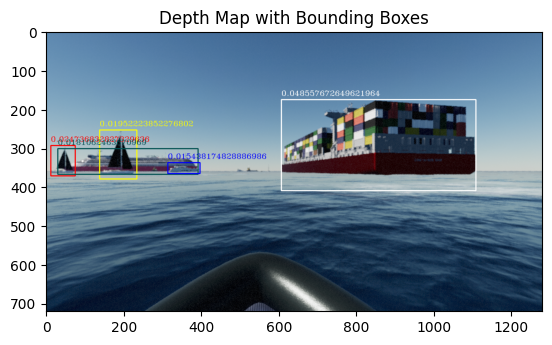

In [ ]:
def visualize_depth_with_boxes(image, depth_map, bbox_list):
    copy_depth_map = depth_map
    # Convert depth map to RGB for visualization
    depth_colormap = cv2.applyColorMap((255 * copy_depth_map / np.max(copy_depth_map)).astype(np.uint8), cv2.COLORMAP_VIRIDIS)
    colors = [ (255,255,255), (255,0,0), (255,255,0), (0,80,80),(0,0,255)]
    # Draw bounding boxes
    for i,bbox in enumerate(bbox_list):
        x_min, y_min, x_max, y_max = bbox
        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), colors[i], 2)
        label = (depth_results[i]['mean_depth'])
        cv2.putText(image, f'{label}', (int(x_min), int(y_min - 10)), cv2.FONT_HERSHEY_COMPLEX_SMALL, 1, colors[i], 1)

    plt.imshow(image)
    plt.title('Depth Map with Bounding Boxes')
    plt.show()

# Visualize the depth with bounding boxes
visualize_depth_with_boxes(image, normalized_depth_map, bbox_list)


In [ ]:
# Bboxes analysis of depth anything
img_path = '/content/drive/MyDrive/dataset1/images/00/0_CamFeed_1.png'
image = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_RGB2BGR)
bbox_path =  img_path.replace('CamFeed', 'RawMeta').replace('.png','.txt').replace('images','new_labels')
boxes = load_bounding_boxes(bbox_path)
bbox_list = []
for new_bbox in boxes:
        label = new_bbox['Alias']
        bb2d = new_bbox['BB2D']
        x = np.clip(bb2d[0]['X'], 0, image.shape[1]) # Clip bbox to image width
        y = np.clip(bb2d[0]['Y'], 0, image.shape[0]) # Clip bbox to image height
        x1 = np.clip(bb2d[1]['X'], 0, image.shape[1]) # Clip bbox to image width
        y1 = np.clip(bb2d[1]['Y'], 0, image.shape[0]) # Clip bbox to image height
        bbox_list.append((int(x),int(y),int(x1),int(y1)))

depth_image = '/content/0_CamFeed_1_depth.png'
depth_map = np.array(Image.open(depth_image).convert('L'))
depth_min, depth_max = np.min(depth_map), np.max(depth_map)
normalized_depth_map = 255 * (depth_map - depth_min) / (depth_max - depth_min)
depth_results = depth_analysis_of_bboxes(img_path,normalized_depth_map, bbox_list)

# Print the depth analysis results
for result in depth_results:
    print(f"Bounding Box: {result['bbox']}")
    print(f"Mean Depth: {result['mean_depth']}")
    print(f"Median Depth: {result['median_depth']}")
    print(f"Variance in Depth: {result['variance_depth']}")
    print("-----")


Bounding Box: (607, 176, 1109, 410)
Mean Depth: 0.8200214726814208
Median Depth: 0.9882352941176471
Variance in Depth: 0.13554499453503352
-----
Bounding Box: (12, 294, 75, 372)
Mean Depth: 0.4448091487307174
Median Depth: 0.0
Variance in Depth: 0.24590032552997085
-----
Bounding Box: (138, 254, 234, 380)
Mean Depth: 0.5484233971366325
Median Depth: 0.9882352941176471
Variance in Depth: 0.2450899041297332
-----
Bounding Box: (30, 302, 392, 368)
Mean Depth: 0.6602679377460008
Median Depth: 0.996078431372549
Variance in Depth: 0.22252791203096106
-----
Bounding Box: (314, 338, 397, 366)
Mean Depth: 0.9181515979885929
Median Depth: 0.996078431372549
Variance in Depth: 0.07291403565430851
-----


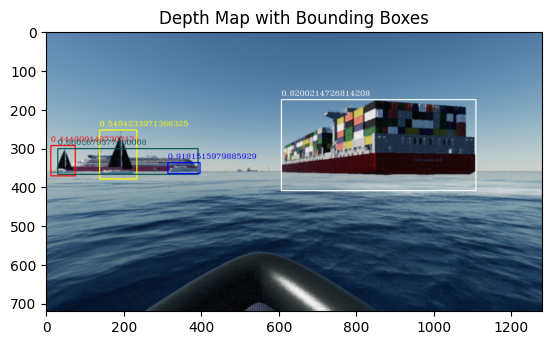

In [ ]:

visualize_depth_with_boxes(image, normalized_depth_map, bbox_list)

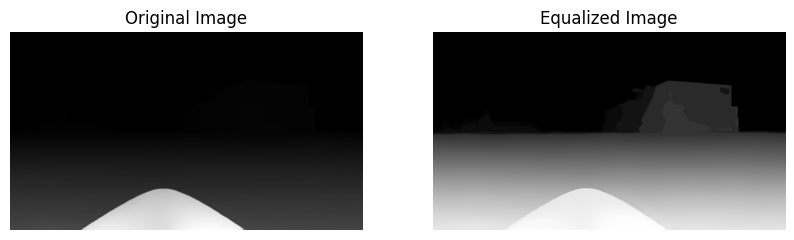

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Load the image in grayscale
image = cv2.imread('/content/0_CamFeed_1_depth.png', cv2.IMREAD_GRAYSCALE)
normalized_image = cv2.normalize(
    image, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)

# Apply histogram equalization
equalized_image = cv2.equalizeHist(normalized_image)

# Plot the original and equalized images side by side for comparison
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(equalized_image, cmap='gray')
plt.title('Equalized Image')
plt.axis('off')

plt.show()


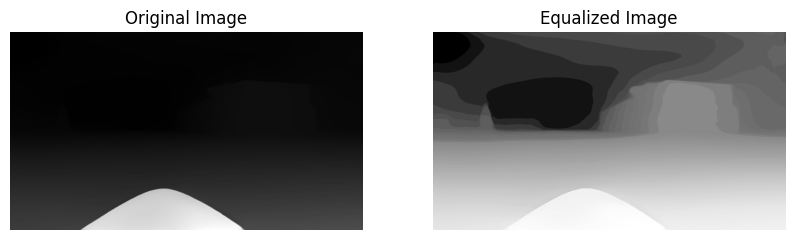

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Load the image in grayscale
image = cv2.imread('/content/Depth-Anything/midas_output.png', cv2.IMREAD_GRAYSCALE)

# Apply histogram equalization
equalized_image = cv2.equalizeHist(image)

# Plot the original and equalized images side by side for comparison
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(equalized_image, cmap='gray')
plt.title('Equalized Image')
plt.axis('off')

plt.show()


## Segmentation + depth

### MaskRCNN

In [ ]:
def analyze_depth_per_object(image, masks, labels, depth_map):
    num_objects = masks.shape[0]

    for i in range(num_objects):
        mask = masks[i, 0].cpu().numpy()  # Extract the mask for the i-th object
        object_depth = depth_map[mask]    # Extract the depth values where mask is True

        mean_depth = np.mean(object_depth)
        median_depth = np.median(object_depth)
        variance_depth = np.var(object_depth)

        print(f"Object {i + 1} (Label: {labels[i].item()}):")
        print(f"Mean Depth: {mean_depth}")
        print(f"Median Depth: {median_depth}")
        print(f"Variance in Depth: {variance_depth}")
        print("-----")

        # Optionally visualize each object with its mask
        masked_image = image.copy()
        masked_image[~mask] = 0  # Zero out areas outside the mask
        plt.imshow(masked_image)
        plt.title(f"Object {i + 1} (Label: {labels[i].item()})")
        plt.show()


In [ ]:
import torch
import torchvision
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Load pre-trained Mask R-CNN model
seg_model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=True)
seg_model.eval()

# Perform inference for object segmentation
def get_object_masks(image):
    transform = torchvision.transforms.ToTensor()
    image_tensor = transform(image).unsqueeze(0)
    with torch.no_grad():
        predictions = seg_model(image_tensor)[0]

    # Get masks with confidence threshold, and class labels
    masks = predictions['masks'] > 0.5
    labels = predictions['labels']

    return masks, labels


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MaskRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=MaskRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth" to /root/.cache/torch/hub/checkpoints/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth
100%|██████████| 170M/170M [00:02<00:00, 82.4MB/s]


Object 1 (Label: 9):
Mean Depth: 1.4276608228683472
Median Depth: 1.4432332515716553
Variance in Depth: 0.124000184237957
-----


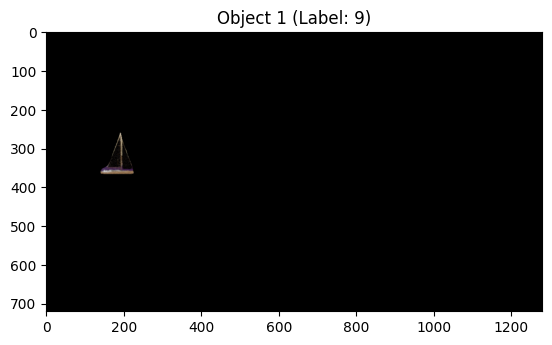

Object 2 (Label: 9):
Mean Depth: 1.2048059701919556
Median Depth: 1.218471646308899
Variance in Depth: 0.09576348215341568
-----


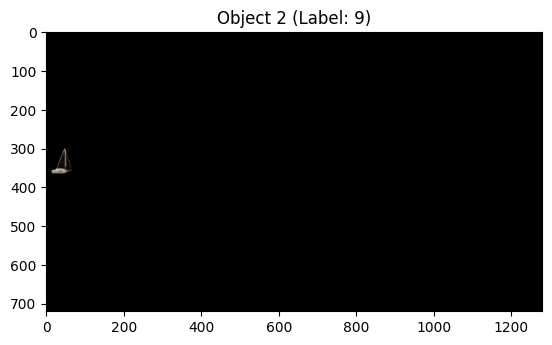

Object 3 (Label: 65):
Mean Depth: 2.9652678966522217
Median Depth: 3.0391149520874023
Variance in Depth: 0.5411033630371094
-----


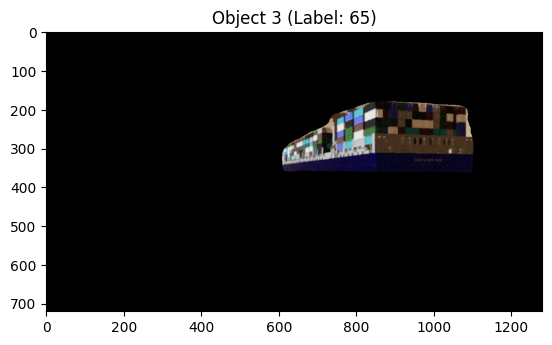

Object 4 (Label: 9):
Mean Depth: 1.092768669128418
Median Depth: 1.1285209655761719
Variance in Depth: 0.058705706149339676
-----


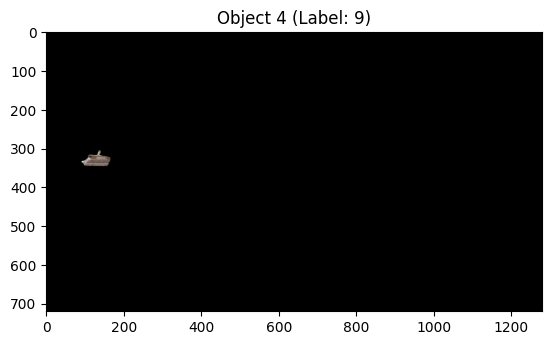

Object 5 (Label: 9):
Mean Depth: 1.8185862302780151
Median Depth: 1.7974941730499268
Variance in Depth: 0.01227186806499958
-----


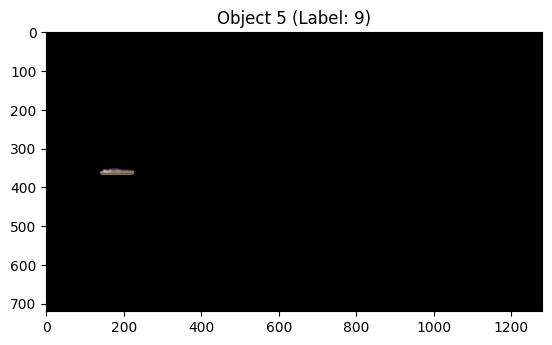

Object 6 (Label: 9):
Mean Depth: 1.2696659564971924
Median Depth: 1.3126671314239502
Variance in Depth: 0.05061732977628708
-----


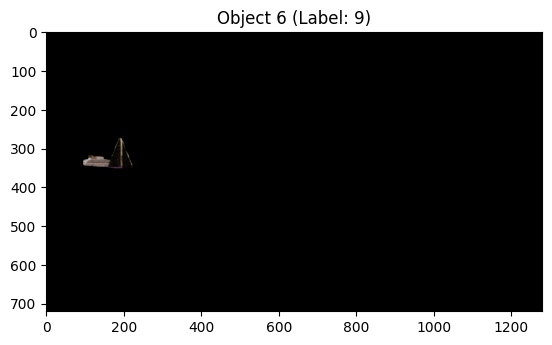

Object 7 (Label: 9):
Mean Depth: 1.2998851537704468
Median Depth: 1.3152737617492676
Variance in Depth: 0.0066094836220145226
-----


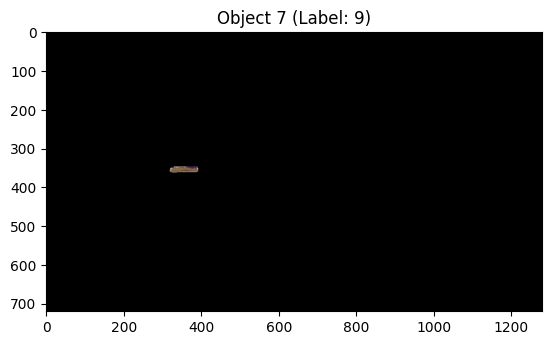

Object 8 (Label: 74):
Mean Depth: 57.93132400512695
Median Depth: 58.76943588256836
Variance in Depth: 27.508071899414062
-----


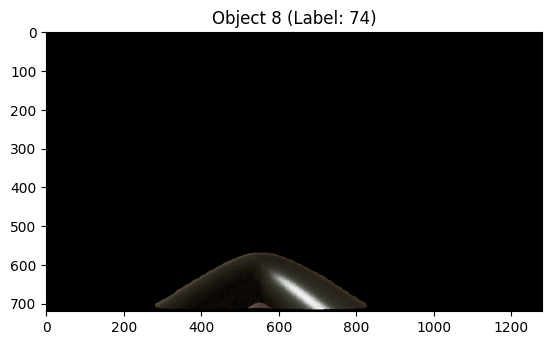

Object 9 (Label: 51):
Mean Depth: 57.87236785888672
Median Depth: 58.63273239135742
Variance in Depth: 26.45247459411621
-----


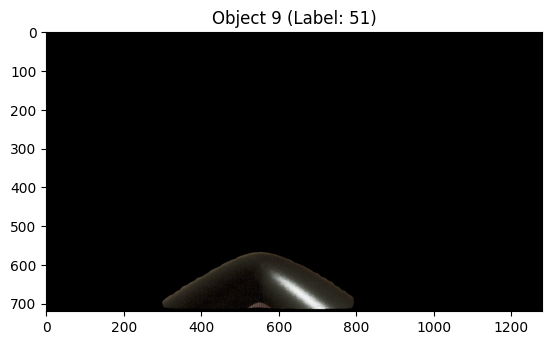

Object 10 (Label: 65):
Mean Depth: 21.22597885131836
Median Depth: 17.72602653503418
Variance in Depth: 232.24464416503906
-----


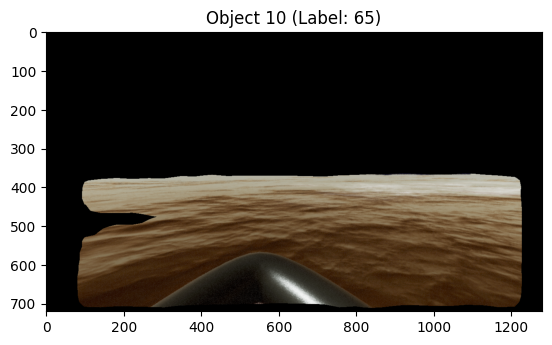

Object 11 (Label: 9):
Mean Depth: 1.2237904071807861
Median Depth: 1.230102300643921
Variance in Depth: 0.033302098512649536
-----


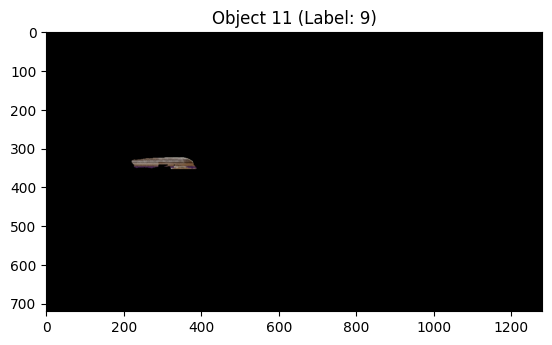

Object 12 (Label: 1):
Mean Depth: 1.0121597051620483
Median Depth: 1.013179898262024
Variance in Depth: 0.003561150748282671
-----


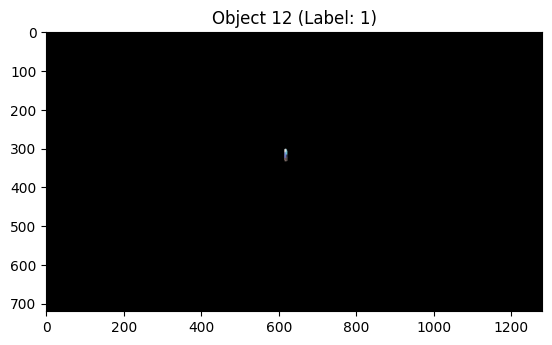

Object 13 (Label: 42):
Mean Depth: 57.7746696472168
Median Depth: 58.63798141479492
Variance in Depth: 27.22210121154785
-----


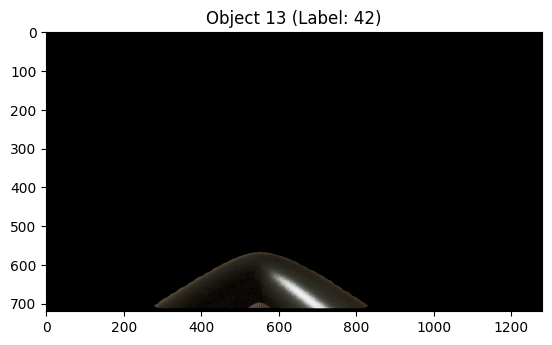

Object 14 (Label: 9):
Mean Depth: 1.140544056892395
Median Depth: 1.152546763420105
Variance in Depth: 0.03492024913430214
-----


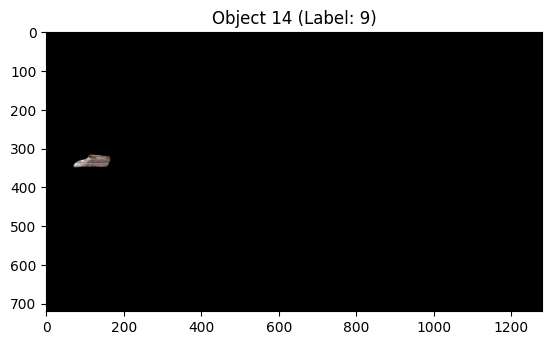

Object 15 (Label: 50):
Mean Depth: 57.7468376159668
Median Depth: 58.52393341064453
Variance in Depth: 23.84018898010254
-----


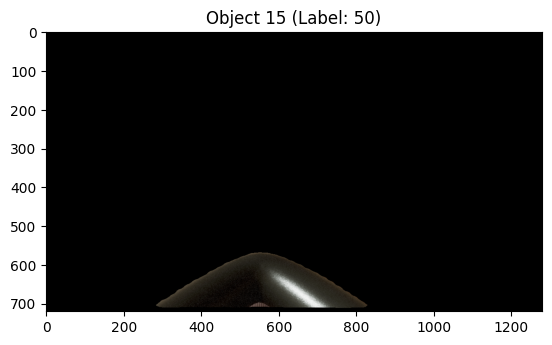

Object 16 (Label: 9):
Mean Depth: 1.3355273008346558
Median Depth: 1.3337332010269165
Variance in Depth: 0.034733209758996964
-----


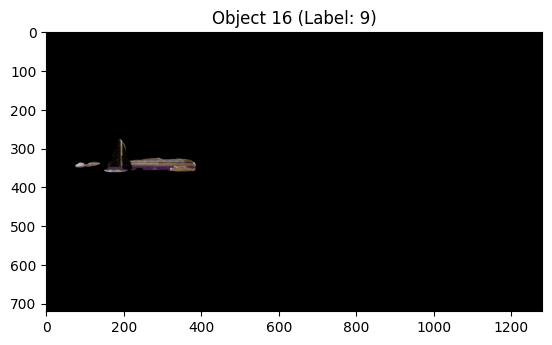

Object 17 (Label: 67):
Mean Depth: 19.836828231811523
Median Depth: 16.85948944091797
Variance in Depth: 206.00852966308594
-----


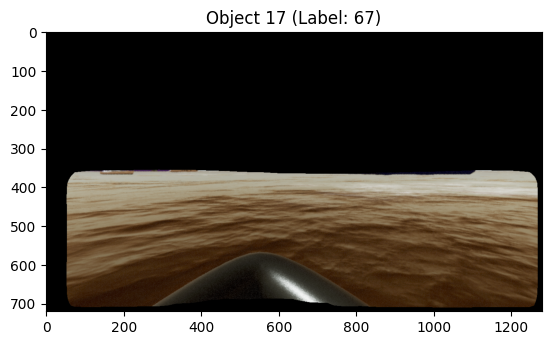

Object 18 (Label: 9):
Mean Depth: 1.0899869203567505
Median Depth: 1.0926525592803955
Variance in Depth: 0.018366873264312744
-----


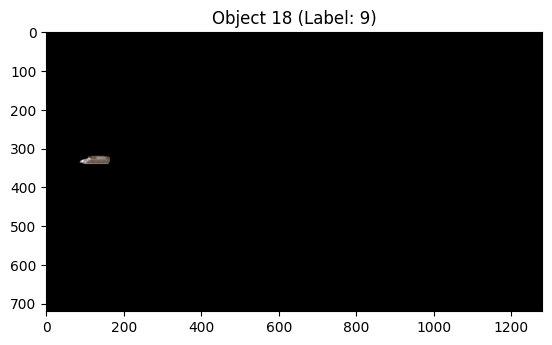

Object 19 (Label: 62):
Mean Depth: 57.71743392944336
Median Depth: 58.55766296386719
Variance in Depth: 26.86739730834961
-----


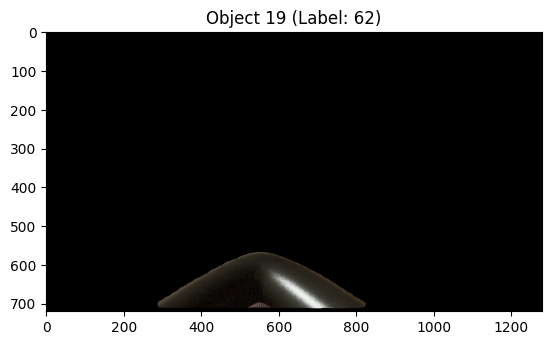

Object 20 (Label: 9):
Mean Depth: 1.2592300176620483
Median Depth: 1.273644208908081
Variance in Depth: 0.028505491092801094
-----


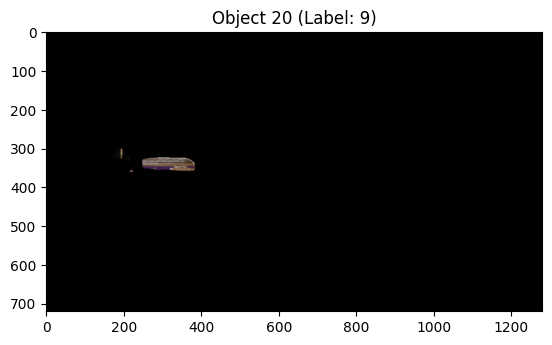

Object 21 (Label: 9):
Mean Depth: 1.5062004327774048
Median Depth: 1.526241421699524
Variance in Depth: 0.00920125562697649
-----


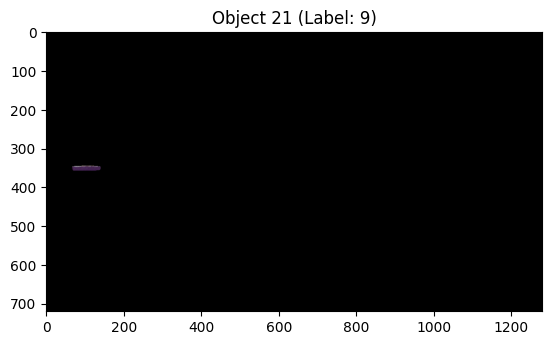

Object 22 (Label: 47):
Mean Depth: 57.797035217285156
Median Depth: 58.65508270263672
Variance in Depth: 29.535051345825195
-----


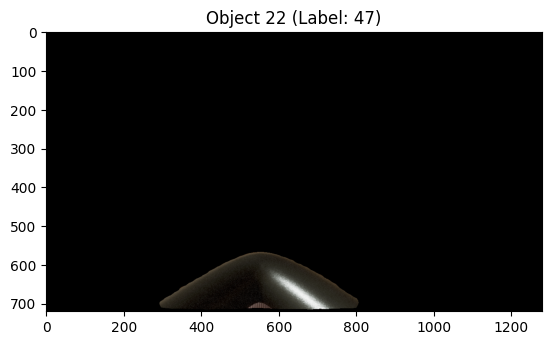

Object 23 (Label: 60):
Mean Depth: 57.791473388671875
Median Depth: 58.62830352783203
Variance in Depth: 28.068042755126953
-----


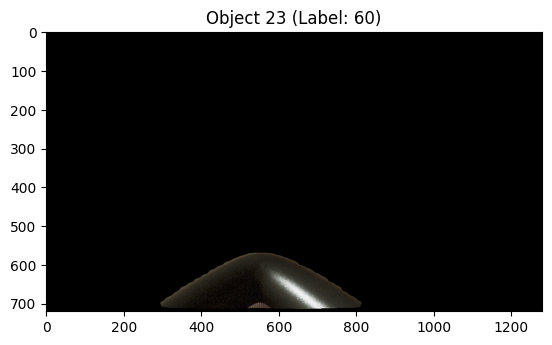

Object 24 (Label: 9):
Mean Depth: 1.2151024341583252
Median Depth: 1.2339425086975098
Variance in Depth: 0.018273916095495224
-----


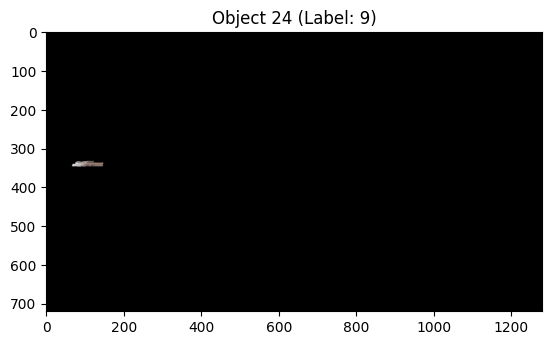

Object 25 (Label: 9):
Mean Depth: 1.4697304964065552
Median Depth: 1.4655530452728271
Variance in Depth: 0.018357038497924805
-----


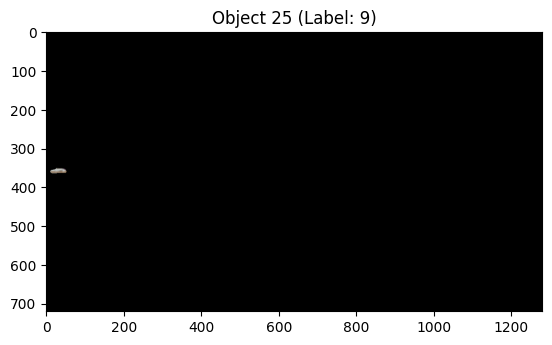

In [ ]:
image = cv2.imread('/content/drive/MyDrive/dataset1/images/00/0_CamFeed_1.png')
depth_map = estimate_depth(image)  # Get the depth map from MiDaS

# Get masks and labels from Mask R-CNN
masks, labels = get_object_masks(image)

# Analyze depth for each object
analyze_depth_per_object(image, masks, labels, depth_map)


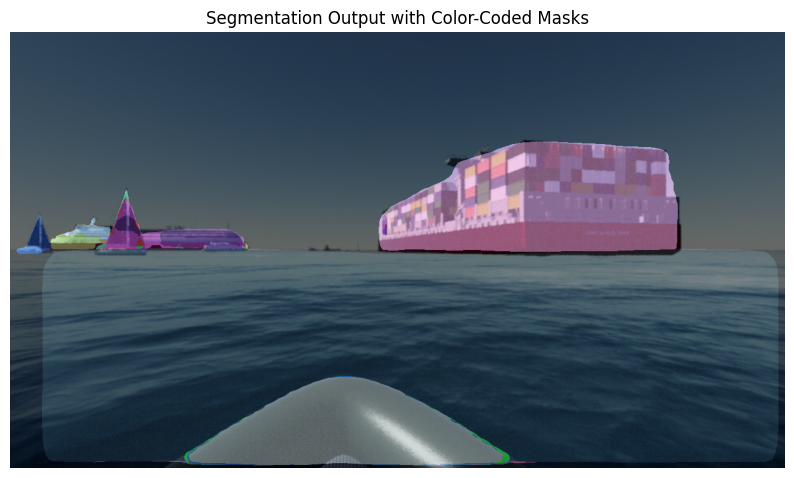

In [ ]:
def visualize_segmentation(image, masks, labels):
    num_objects = masks.shape[0]

    # Create an empty color-coded mask
    colored_mask = np.zeros_like(image, dtype=np.uint8)

    # Randomly generate colors for each object
    colors = []
    for _ in range(num_objects):
        colors.append([random.randint(0, 255), random.randint(0, 255), random.randint(0, 255)])

    # Overlay color for each object in the colored mask
    for i in range(num_objects):
        mask = masks[i, 0].cpu().numpy()  # Extract the mask for the i-th object
        color = colors[i]
        colored_mask[mask] = color

    # Combine the original image with the colored mask (blending)
    blended_image = cv2.addWeighted(image, 0.5, colored_mask, 0.5, 0)

    # Plot the results
    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(blended_image, cv2.COLOR_BGR2RGB))
    plt.title("Segmentation Output with Color-Coded Masks")
    plt.axis('off')
    plt.show()

visualize_segmentation(image, masks, labels)

### Deeplabv3

In [ ]:
import torch
import torchvision
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import torchvision.transforms as T

# Load pre-trained DeepLabv3 model
model = torchvision.models.segmentation.deeplabv3_resnet101(pretrained=True).eval()

# Define image preprocessing
def preprocess_image(image):
    transform = T.Compose([
        T.Resize((520, 520)),
        T.ToTensor(),
        T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    return transform(image).unsqueeze(0)

# Load and preprocess the image
image_path = '/content/drive/MyDrive/dataset1/images/00/0_CamFeed_1.png'
input_image = Image.open(image_path)
input_tensor = preprocess_image(input_image)

# Perform inference with the DeepLabv3 model
with torch.no_grad():
    output = model(input_tensor)



/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet101_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


KeyboardInterrupt: 

520


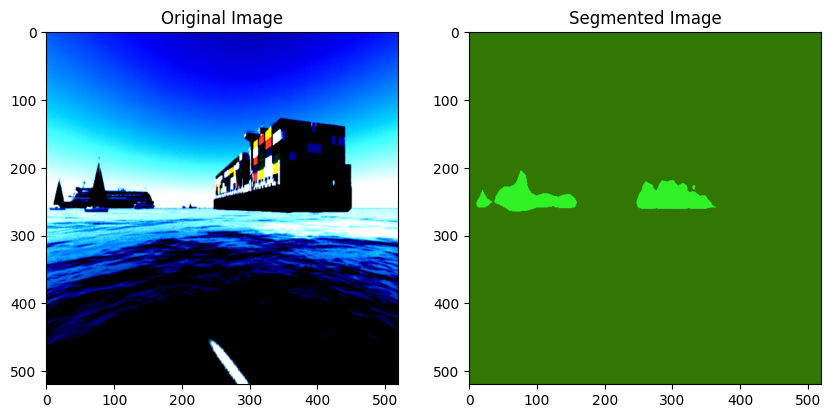

In [ ]:
# Visualize the segmentation result
def visualize_segmentation(output, input_image):
    # Get the output predictions and resize to match input image size
    output_predictions = output['out'][0].argmax(0).byte().cpu().numpy()

    # Create a color map for visualization (21 different colors for 21 classes in COCO dataset)
    colors = np.random.randint(0, 255, (21, 3), dtype="uint8")

    # Map the predicted classes to their colors
    segmented_image = colors[output_predictions]
    print(len(output_predictions))

    # Overlay the segmentation result with the original image
    segmented_image = Image.fromarray(segmented_image)
    # input_image = input_image.convert("RGB")

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(input_image.transpose((1, 2, 0)))
    plt.title('Original Image')

    plt.subplot(1, 2, 2)
    plt.imshow(segmented_image)
    plt.title('Segmented Image')
    plt.show()

# Visualize the segmentation result
visualize_segmentation(output, input_tensor.numpy()[0])

### YOLO

In [ ]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.9/41.9 kB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 871.9/871.9 kB 13.0 MB/s eta 0:00:00



0: 384x640 1 airplane, 1 surfboard, 476.6ms
Speed: 2.8ms preprocess, 476.6ms inference, 9.2ms postprocess per image at shape (1, 3, 384, 640)
ultralytics.engine.results.Boxes object with attributes:

cls: tensor([37.,  4.])
conf: tensor([0.5320, 0.2818])
data: tensor([[2.5986e+02, 5.6932e+02, 8.4308e+02, 7.1413e+02, 5.3202e-01, 3.7000e+01],
        [7.3367e-01, 3.0179e+02, 3.4560e+02, 3.7201e+02, 2.8181e-01, 4.0000e+00]])
id: None
is_track: False
orig_shape: (720, 1280)
shape: torch.Size([2, 6])
xywh: tensor([[551.4720, 641.7269, 583.2188, 144.8094],
        [173.1667, 336.9009, 344.8660,  70.2130]])
xywhn: tensor([[0.4308, 0.8913, 0.4556, 0.2011],
        [0.1353, 0.4679, 0.2694, 0.0975]])
xyxy: tensor([[2.5986e+02, 5.6932e+02, 8.4308e+02, 7.1413e+02],
        [7.3367e-01, 3.0179e+02, 3.4560e+02, 3.7201e+02]])
xyxyn: tensor([[2.0302e-01, 7.9073e-01, 6.5866e-01, 9.9185e-01],
        [5.7318e-04, 4.1916e-01, 2.7000e-01, 5.1668e-01]])


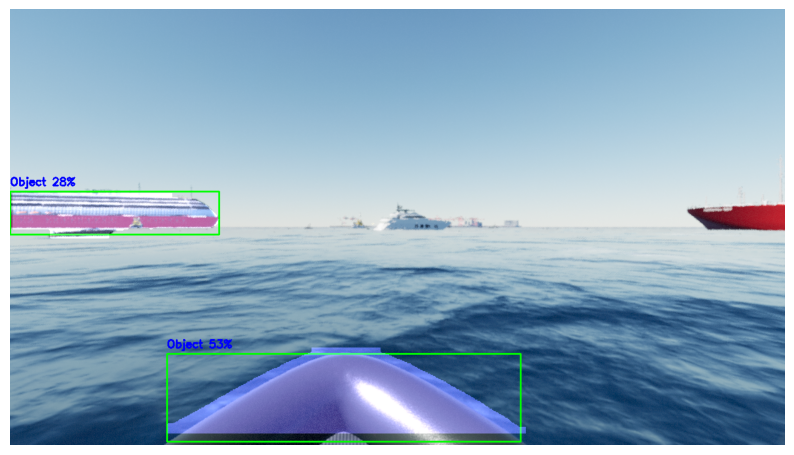

In [ ]:
import torch
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Load a pre-trained YOLOv8 model (Segmentation)
model = YOLO('yolov8n-seg.pt')

# Iterate over all detected objects
def visualize_segmentation(image, results):
    segmented_image = image.copy()

    # Get image dimensions
    image_height, image_width = image.shape[:2]

    # Iterate over the results and draw bounding boxes and masks
    for result in results:
        result.show()  # display to screen
        print(result.boxes)
        for box, mask, score in zip(result.boxes.xyxy, result.masks.data, result.boxes.conf):
            # Get bounding box, mask, and confidence score
            box = box.cpu().numpy()  # Get the box coordinates
            mask = mask.cpu().numpy()  # Get the mask
            score = score.cpu().numpy()  # Confidence score

            # Resize the mask to match the image dimensions
            mask_resized = cv2.resize(mask, (image_width, image_height))

            # Draw bounding box
            x1, y1, x2, y2 = box.astype(int)
            cv2.rectangle(segmented_image, (x1, y1), (x2, y2), (0, 255, 0), 2)

            # Generate a random color for the mask
            color = np.random.randint(0, 255, (1, 3)).tolist()[0]

            # Apply mask with transparency
            mask_resized = mask_resized > 0.5
            mask_image = np.zeros_like(segmented_image, dtype=np.uint8)
            mask_image[mask_resized] = color
            segmented_image = cv2.addWeighted(segmented_image, 1, mask_image, 0.5, 0)

            # Add label with confidence score
            label = f"Object {int(score * 100)}%"
            cv2.putText(segmented_image, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)

    # Show the segmented image
    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(segmented_image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()


# Load the image
image_path = '/content/drive/MyDrive/dataset1/images/00/0_CamFeed_100.png'
image = cv2.imread(image_path)

# Perform instance segmentation
results = model(image)

# Visualize the segmentation result
visualize_segmentation(image, results)


In [ ]:
print(result)  # display to screen

{'bbox': (314, 338, 397, 366), 'mean_depth': 5.5903807, 'median_depth': 5.6889076, 'variance_depth': 0.37472436}


# Depth Anything

In [ ]:
# !git clone https://github.com/LiheYoung/Depth-Anything
%cd Depth-Anything
!pip install -r requirements.txt

/content/Depth-Anything
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.4/50.4 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.6/16.6 MB 94.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 305.1/305.1 kB 26.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.5/101.5 kB 8.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 141.9/141.9 kB 13.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.8/62.8 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.0/94.0 kB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.4/76.4 kB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.4/71.4 kB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.9/129.9 kB 11.3 MB/s eta 0:00:00
  Attempting uninstall: to

In [ ]:
%cd Depth-Anything

/content/Depth-Anything


In [ ]:
!python run.py --encoder vits --img-path /content/drive/MyDrive/dataset1/images/00/0_CamFeed_1.png --outdir /content --pred-only --grayscale

xFormers not available
xFormers not available
/usr/local/lib/python3.10/dist-packages/huggingface_hub/hub_mixin.py:824: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_d

# Removing boxes based on features

In [ ]:
def enhance_image_contrast(image):
    # # Convert to grayscale
    # gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # # Apply histogram equalization
    # enhanced = cv2.equalizeHist(gray)

    return image

<ipython-input-86-0044e6fbffe1>:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 2, figsize=(12, 8))


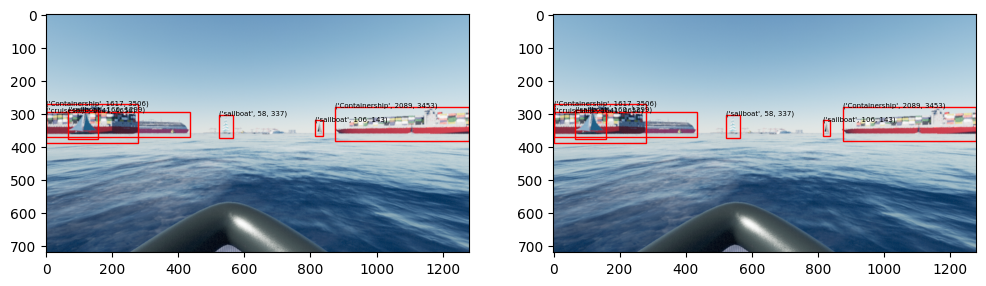

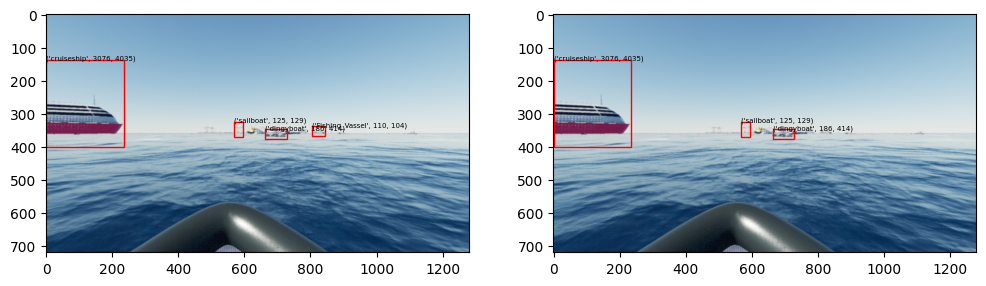

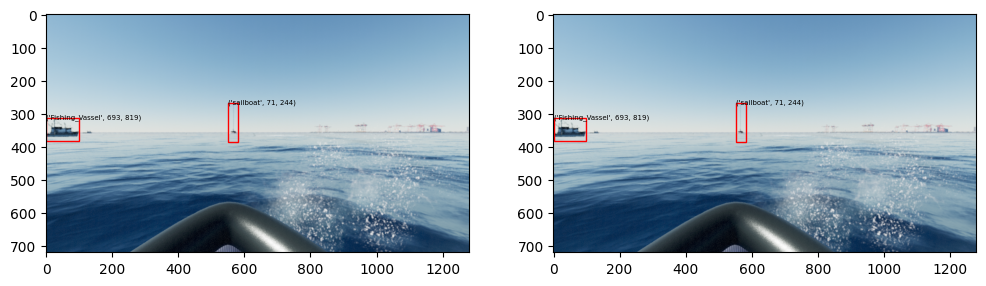

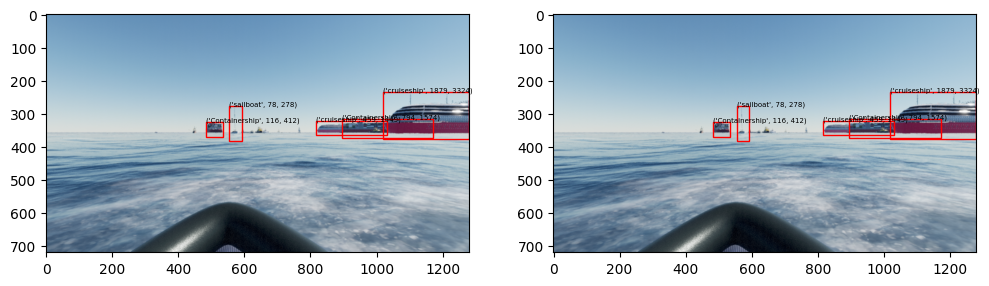

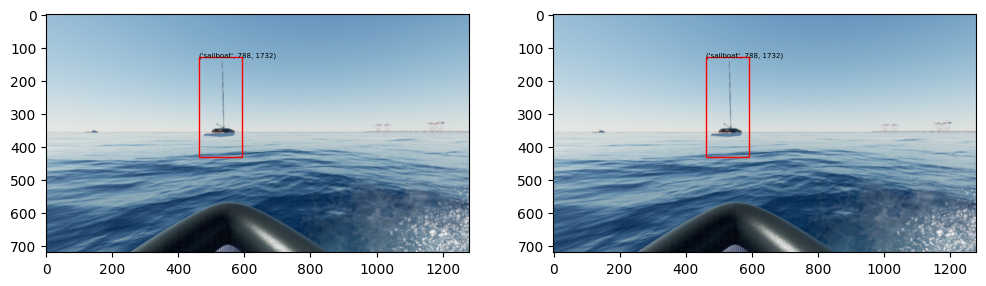

...

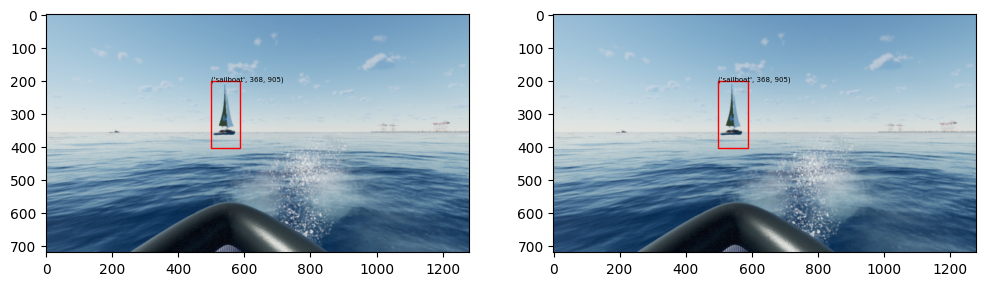

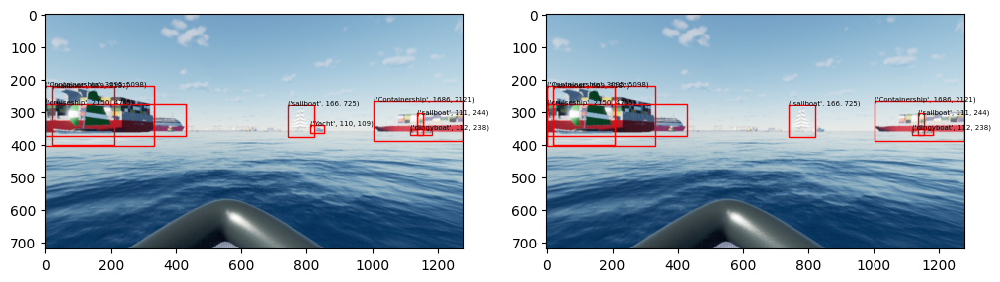

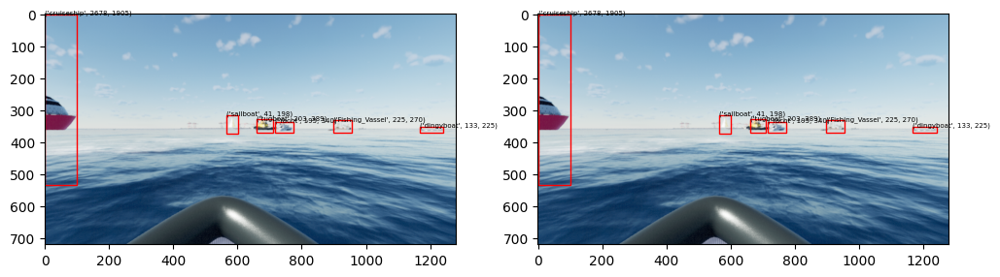

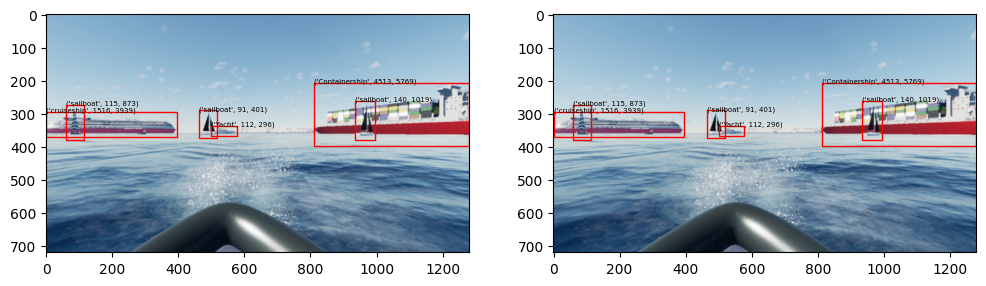

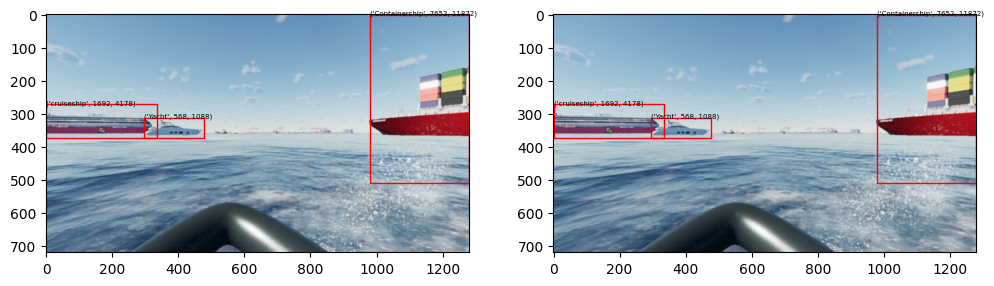

In [ ]:
# Function to visualize random samples
def visualize_random_samples_feature_detection(dataset_folder, n_samples=5):
  for subfolder in image_paths:
    if len(subfolder) == 0: continue
    for n in range(0,n_samples):
      # Randomly select an image
      img_fn = random.choice(subfolder)
      bbox_fn = img_fn.replace('CamFeed', 'RawMeta').replace('.png','.txt').replace('images','new_labels')
      original_image = cv2.cvtColor(cv2.imread(img_fn),cv2.COLOR_BGR2RGB)
      img = enhance_image_contrast(original_image)
      img_np = np.array(img)
      bbox_data = getBboxes(bbox_fn)

      fig, ax = plt.subplots(1, 2, figsize=(12, 8))
      ax[0].imshow(original_image)
      ax[1].imshow(original_image)
      img = Image.fromarray(img)
      for bbox in bbox_data:
        bb2d = bbox['BB2D']
        x = np.clip(bb2d[0]['X'], 0, img.size[0]) # Clip bbox to image width
        y = np.clip(bb2d[0]['Y'], 0, img.size[1]) # Clip bbox to image height
        x1 = np.clip(bb2d[1]['X'], 0, img.size[0]) # Clip bbox to image width
        y1 = np.clip(bb2d[1]['Y'], 0, img.size[1]) # Clip bbox to image height
        area = (x1-x) *(y1-y)

        object_region = img_np[int(y):int(y1), int(x):int(x1)]
        edge_threshold = 50

        # Apply Canny edge detection
        edges = cv2.Canny(object_region, edge_threshold, edge_threshold * 3)

        # If very few edges are detected, it might mean no visible object
        # thresh = area/10
        # # print(area, " ", thresh, " ", np.count_nonzero(edges))
        # # if len(bbox_data) < 10:
        # if area > 2000:
        #   if bbox['Alias'] == 'sailboat':
        #     thresh = thresh/5
        #   elif (bbox['Alias'] == 'cruiseship' or bbox['Alias'] == 'Containership' or bbox['Alias'] == 'Yacht'):
        #     thresh = thresh/2

        isValid = False
        # if np.count_nonzero(edges) > thresh or abs(np.count_nonzero(edges) - thresh) >= 300:
        #     isValid = True# Threshold for minimum edge count
        if np.count_nonzero(edges) > 500:
          isValid = True

        if not isValid:
          rect = patches.Rectangle(
            (x, y), x1-x, y1-y,
            linewidth=1, edgecolor='r', facecolor='none'
          )
          ax[0].add_patch(rect)
          ax[0].text(
              x, y, (bbox['Alias'], int(thresh), np.count_nonzero(edges)), color='black',
              fontsize=5
          )
        else:
          rect = patches.Rectangle(
            (x, y), x1-x, y1-y,
            linewidth=1, edgecolor='r', facecolor='none'
          )
          ax[0].add_patch(rect)
          ax[0].text(
              x, y, (bbox['Alias'], int(thresh), np.count_nonzero(edges)), color='black',
              fontsize=5
          )

          rect = patches.Rectangle(
            (x, y), x1-x, y1-y,
            linewidth=1, edgecolor='r', facecolor='none'
          )
          ax[1].add_patch(rect)
          ax[1].text(
              x, y, (bbox['Alias'], int(thresh), np.count_nonzero(edges)), color='black',
              fontsize=5
          )


# Call the function to visualize random samples
visualize_random_samples_feature_detection('/content/drive/MyDrive/dataset1/images', n_samples=20)


In [ ]:
new_label_folder = '/content/drive/MyDrive/dataset1/feature_labels'

for j, subfolder in enumerate(label_paths):

  if len(subfolder) == 0: continue

  print(len(subfolder))
  for label_fn in subfolder:
    with open(label_fn, 'r') as f:
        file_data = eval(str(json.load(f)))

    bbox_data = file_data['TrackedObj']

    img_fn = label_fn.replace('RawMeta', 'CamFeed').replace('.txt','.png').replace('labels','images')
    img = Image.open(img_fn)
    # print(label_fn)
    img_np = np.array(img)

    indexes_to_del = []
    for i, bbox in enumerate(bbox_data):
      bb2d = bbox['BB2D']
      x = np.clip(bb2d[0]['X'], 0, img.size[0]) # Clip bbox to image width
      y = np.clip(bb2d[0]['Y'], 0, img.size[1]) # Clip bbox to image height
      x1 = np.clip(bb2d[1]['X'], 0, img.size[0]) # Clip bbox to image width
      y1 = np.clip(bb2d[1]['Y'], 0, img.size[1]) # Clip bbox to image height

      area = int(x1-x) * int(y1-y)

      object_region = img_np[int(y):int(y1), int(x):int(x1)]
      edge_threshold = 50

      if area != 0:
        # Apply Canny edge detection
        edges = cv2.Canny(object_region, edge_threshold, edge_threshold * 3)

        # # If very few edges are detected, it might mean no visible object
        # thresh = area/10
        # # if len(bbox_data) < 10:
        # if area > 2000:
        #   if bbox['Alias'] == 'sailboat':
        #     thresh = thresh/5
        #   elif (bbox['Alias'] == 'cruiseship' or bbox['Alias'] == 'Containership' or bbox['Alias'] == 'Yacht'):
        #     thresh = thresh/2

        isValid = False
        # if np.count_nonzero(edges) > thresh or abs(np.count_nonzero(edges) - thresh) >= 300:
        #     isValid = True# Threshold for minimum edge count
        if np.count_nonzero(edges) > 500:
          isValid = True

        if not isValid:
          indexes_to_del.append(i)

      else:
        indexes_to_del.append(i)

    for k,index in enumerate(indexes_to_del):
      del (file_data['TrackedObj'])[index - k]

    new_label_fn = os.path.join(new_label_folder, os.path.basename(os.path.dirname(label_fn)), os.path.basename(label_fn))
    print(new_label_fn)
    with open(new_label_fn, 'w') as f:
      f.write(json.dumps(file_data))


1129
/content/drive/MyDrive/dataset1/feature_labels/00/0_RawMeta_952.txt
/content/drive/MyDrive/dataset1/feature_labels/00/0_RawMeta_542.txt
/content/drive/MyDrive/dataset1/feature_labels/00/0_RawMeta_744.txt
/content/drive/MyDrive/dataset1/feature_labels/00/0_RawMeta_926.txt
/content/drive/MyDrive/dataset1/feature_labels/00/0_RawMeta_318.txt
/content/drive/MyDrive/dataset1/feature_labels/00/0_RawMeta_309.txt
/content/drive/MyDrive/dataset1/feature_labels/00/0_RawMeta_295.txt
/content/drive/MyDrive/dataset1/feature_labels/00/0_RawMeta_630.txt
/content/drive/MyDrive/dataset1/feature_labels/00/0_RawMeta_308.txt
/content/drive/MyDrive/dataset1/feature_labels/00/0_RawMeta_1002.txt
/content/drive/MyDrive/dataset1/feature_labels/00/0_RawMeta_755.txt
/content/drive/MyDrive/dataset1/feature_labels/00/0_RawMeta_811.txt
/content/drive/MyDrive/dataset1/feature_labels/00/0_RawMeta_730.txt
/content/drive/MyDrive/dataset1/feature_labels/00/0_RawMeta_635.txt
/content/drive/MyDrive/dataset1/feature_la

#Training


##DETR

### Dataloader

In [6]:
import os
import torch
from PIL import Image
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torchvision import transforms
import json

In [28]:
class ObjectDetectionDataset(Dataset):
    def __init__(self, images_dir, labels_dir, transforms=None):
        self.images_dir = images_dir
        self.labels_dir = labels_dir
        self.transforms = transforms
        self.class_to_idx = {'Containership': 0, 'sailboat': 1, 'cruiseship': 2, 'Yacht': 3, 'dingyboat': 4, 'tugboat': 5, 'Fishing_Vassel': 6}

        self.image_files = []

        subfolders = [folder for folder in os.listdir(images_dir) if os.path.isdir(os.path.join(images_dir, folder))]
        for i, class_name in enumerate(subfolders):
            images_class_path = os.path.join(images_dir, class_name)

            # Get all image file names in the class folder
            images = [img for img in os.listdir(images_class_path) if img.endswith('.png') and os.path.isfile(os.path.join(images_class_path, img))]

            for i in range(0,len(images)):
              images[i] = os.path.join(images_class_path, images[i])

            self.image_files = self.image_files + images


    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        image_filename = self.image_files[idx]

        # Load image
        image = Image.open(image_filename).convert("RGB")

        # Load label
        label_path = image_filename.replace('CamFeed', 'RawMeta').replace('.png','.txt').replace('images','feature_labels')
        boxes, labels = self.load_labels(label_path, image)

        # Convert labels from strings to numeric IDs
        label_ids = [self.class_to_idx[label] for label in labels]

        # Convert to tensor
        boxes = torch.tensor(boxes, dtype=torch.float32)
        label_ids = torch.tensor(label_ids, dtype=torch.int64)

        target = {"boxes": boxes, "class_labels": label_ids}

        if self.transforms:
            image = self.transforms(image)
        return image, target

    def load_labels(self, label_path, image):
        boxes = []
        labels = []
        with open(label_path, 'r') as f:
            bbox_data = json.load(f)
        data = eval(str(bbox_data))['TrackedObj']

        for bbox in data:
          bb2d = bbox['BB2D']
          x = np.clip(bb2d[0]['X'], 0, image.size[0]) # Clip bbox to image width
          y = np.clip(bb2d[0]['Y'], 0, image.size[1]) # Clip bbox to image height
          x1 = np.clip(bb2d[1]['X'], 0, image.size[0]) # Clip bbox to image width
          y1 = np.clip(bb2d[1]['Y'], 0, image.size[1]) # Clip bbox to image height

          boxes.append([x,y,x1,y1])
          labels.append(bbox['Alias'])

        return boxes, labels


In [29]:
# Define image transforms
image_transforms = transforms.Compose([
    transforms.ToTensor(),
])

# Initialize dataset and dataloaders
train_dataset = ObjectDetectionDataset(images_dir="/content/drive/MyDrive/dataset1/images",
                                       labels_dir="/content/drive/MyDrive/dataset1/feature_labels",
                                       transforms=image_transforms)

train_dataloader = DataLoader(train_dataset, batch_size=4, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))


### Load and train

In [9]:
!pip install timm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.4/42.4 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 46.2 MB/s eta 0:00:00


In [14]:
from transformers import DetrForObjectDetection, DetrImageProcessor

num_classes = 7  # Update this with the actual number of classes

# Create a weight tensor with 1 for each class
empty_weight = torch.ones(num_classes, device='cuda')

# Load pretrained DETR model and processor
model = DetrForObjectDetection.from_pretrained("facebook/detr-resnet-50", num_labels=num_classes, ignore_mismatched_sizes=True)

model.config.class_weights = empty_weight

# Replace the classification head
model.class_labels_classifier = torch.nn.Linear(model.class_labels_classifier.in_features, num_classes + 1)

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of DetrForObjectDetection were not initialized from the model checkpoin

In [23]:
import torch
from torch.optim import AdamW
from transformers import get_scheduler

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

# Set up optimizer
optimizer = AdamW(model.parameters(), lr=1e-2, weight_decay=1e-4)

# Learning rate scheduler
num_epochs = 10
num_training_steps = num_epochs * len(train_dataloader)
lr_scheduler = get_scheduler(
    name='linear',
    optimizer=optimizer,
    num_warmup_steps=0,
    num_training_steps=num_training_steps
)


In [30]:
from tqdm.auto import tqdm

model.train()
empty_weight = torch.ones(num_classes)
empty_weight[0] = 0.1

for epoch in range(num_epochs):
    progress_bar = tqdm(train_dataloader, desc=f"Epoch {epoch+1}/{num_epochs} Training")

    for batch in progress_bar:
        images, labels = batch  # Unpack the tuple returned by the DataLoader
        pixel_values = torch.stack(images).to(device)  # Stack the images into a tensor and move to the device
        labels = [{k: v.to(device) for k, v in t.items()} for t in labels]

        outputs = model(pixel_values=pixel_values, labels=labels)

        loss = outputs.loss
        loss.backward()

        optimizer.step()
        lr_scheduler.step()
        optimizer.zero_grad()

        progress_bar.set_postfix({'loss': loss.item()})


Epoch 1/10 Training:   0%|          | 0/811 [00:00<?, ?it/s]

OutOfMemoryError: CUDA out of memory. Tried to allocate 226.00 MiB. GPU 0 has a total capacity of 14.75 GiB of which 41.06 MiB is free. Process 12656 has 14.71 GiB memory in use. Of the allocated memory 14.38 GiB is allocated by PyTorch, and 190.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

In [20]:
arr1 = []
arr2 = [1 , 2]
print(arr1 + arr2)

[1, 2]
